# Network Analysis Final Report

## Written By: Alison Chen

For this project, I selected three competing brands (Hulu, Netflix, and HBO) to complete a network analysis of the Tweets that mention these three brands. Using the Twitter API, I downloaded zipfiles containing metadata of the Tweets for each brand. My goal for this project is to better understand the brand perception and differentiation among its competitors and identify users that are hyper-interested in each brand.

In [157]:
import glob
import os
import shutil
import zipfile
import json
import csv

### 1.  Import Data via Twitter API

In [158]:
#Make folder for temporary directory
TMPDIR = 'tmp'

#Does this folder already exist? If not, create it!
if not os.path.exists(TMPDIR):
    os.makedirs(TMPDIR)

In [159]:
#Use glob to look inside folder to pull out list of files
tweetzipfiles = glob.glob('*.zip')

In [160]:
tweetzipfiles

['hbo.zip', 'hulu.zip', 'netflix.zip']

In [161]:
for tweetzipfile in tweetzipfiles:
    with zipfile.ZipFile(tweetzipfile, "r") as f:
        print('Unzipping to tmp directory: %s' % tweetzipfile)
        f.extractall(TMPDIR)

Unzipping to tmp directory: hbo.zip
Unzipping to tmp directory: hulu.zip
Unzipping to tmp directory: netflix.zip


##### Identify unique users based on their 'screen_name' to eliminate repetition in the data

In [162]:
#Print outputs count of parsing through every 1000 of data
#Each row of output corresponds to one tweet
#Each tweet stored as dictionary
uniqueusers = {}
count = 0 
for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        count += 1
        if count % 1000 == 0:
            print(count)
        tweetjson = json.load(f)
        userwhotweeted = tweetjson['user']['screen_name']
        
        if userwhotweeted in uniqueusers:
            uniqueusers[userwhotweeted] += 1
        if userwhotweeted not in uniqueusers:
            uniqueusers[userwhotweeted] = 1

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000


In [163]:
#Number of unique users
len(uniqueusers)

25080

In [164]:
#Number of unique users that have more than two tweets
userstoinclude = set()
usercount = 0
for auser in uniqueusers:
    if uniqueusers[auser] > 2:
        usercount += 1
        userstoinclude.add(auser)
print(len(userstoinclude))

619


In [165]:
#Create edgelist to put into place this idea of who are they talking to?
#Source = Who is tweeting
#Target = Who is being mentioned in the tweet
#Note: order matters! 1st place is the tweeter; 2nd place is who is being tweeted @
edgelist = open('streaming.edgelist.for.gephi.csv', 'w')
csvwriter = csv.writer(edgelist)
header = ['Source', 'Target']
#This line adds the headers to the csv
csvwriter.writerow(header)

15

In [166]:
print('Writing edge list')
count = 0 
for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        userwhotweeted = tweetjson['user']['screen_name']
        if userwhotweeted in userstoinclude:
            count += 1
            if count % 1000 == 0:
                print(count)
                
                
            users = tweetjson['entities']['user_mentions']
            if len(users) > 0:
                for auser in users:
                    screenname = auser['screen_name']
                    row = [userwhotweeted, screenname]
                    csvwriter.writerow(row)
edgelist.close()

Writing edge list
1000
2000
3000


##### Twitter Mentions Graph for Hulu, Netflix, and HBO via Gephi

Overview of Twitter Mentions Network Analysis Gephi Graph

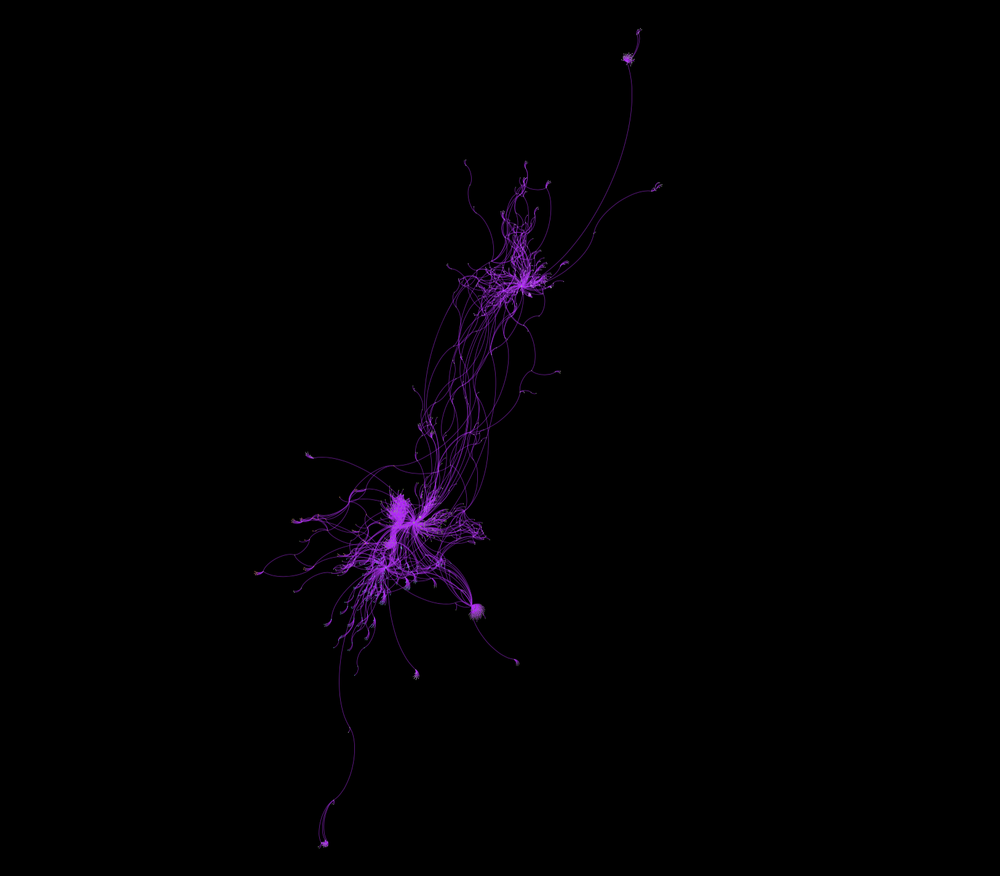

In [167]:
from IPython.display import Image
Image(filename='overview.png', width=800, height=800)

Using the "modularity class" function from Gephi, I was able to organize my network analysis into clusters based on modularity. The different colored boxes and colored nodes indicate different clusters. The breakdown of the data is noted in the image below.

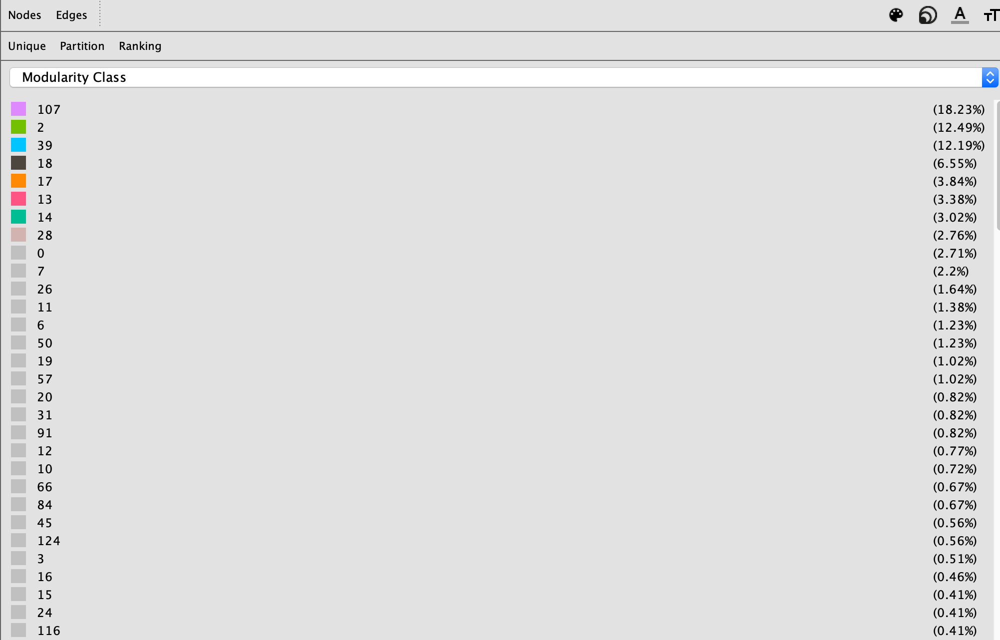

In [168]:
Image(filename='modularity.png', width=800, height=800)

Hulu Twitter Mentions Gephi Graph

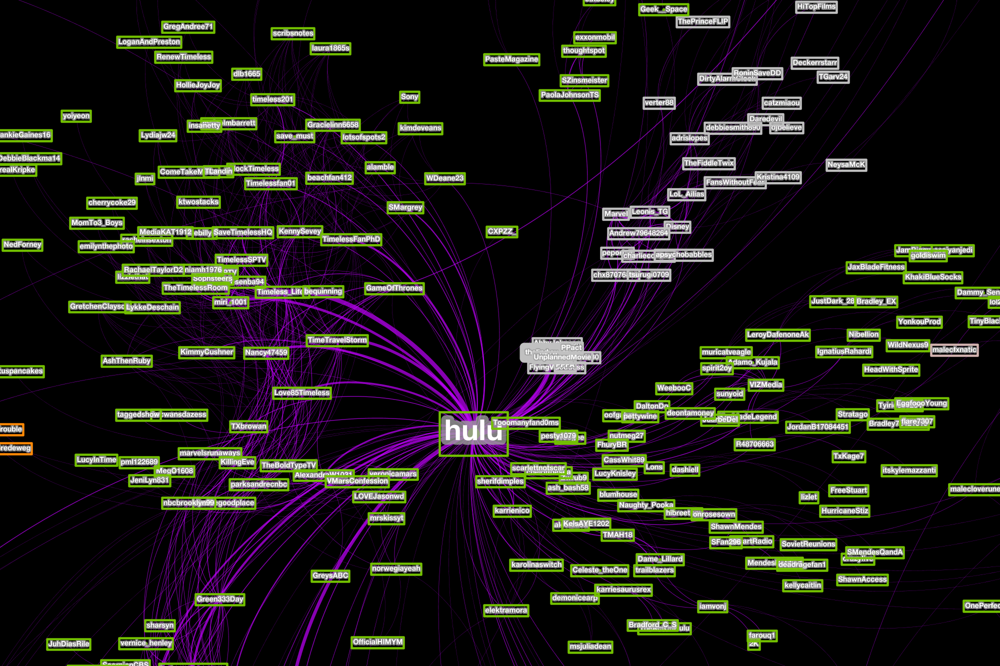

In [169]:
Image(filename='hulu.png', width=800, height=800)

Hulu Support Twitter Mentions Gephi Graph

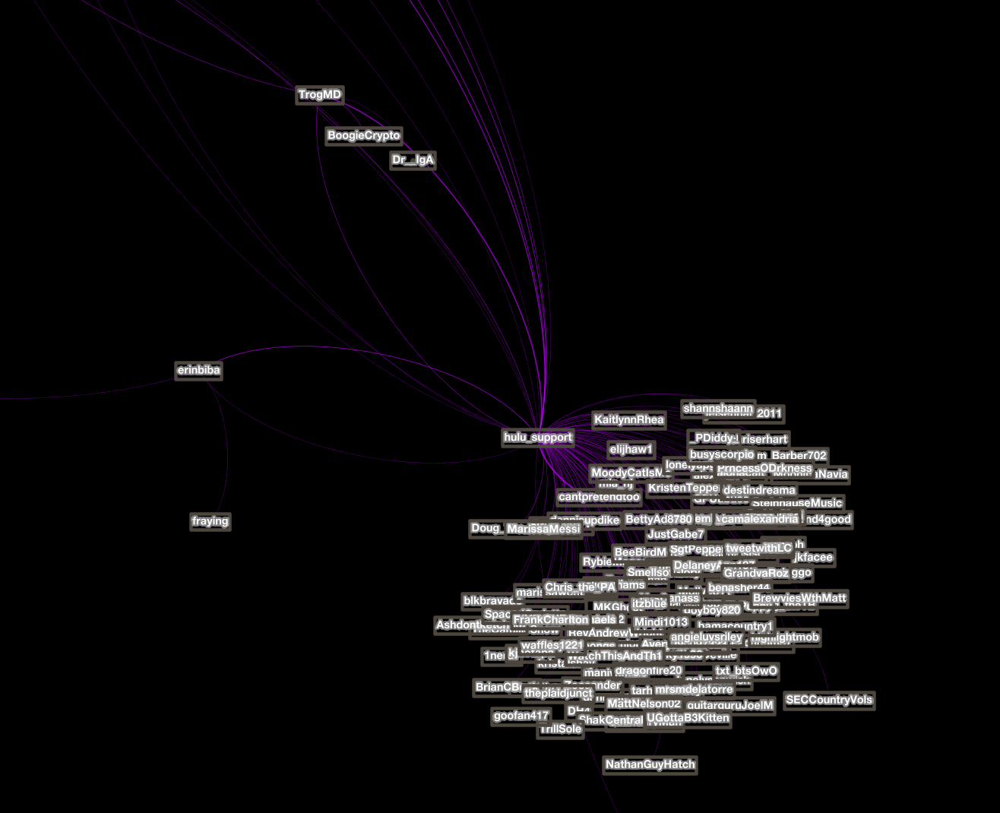

In [170]:
Image(filename='hulusupport.png',width=800, height=800)

Netflix Twitter Mentions Gephi Graph

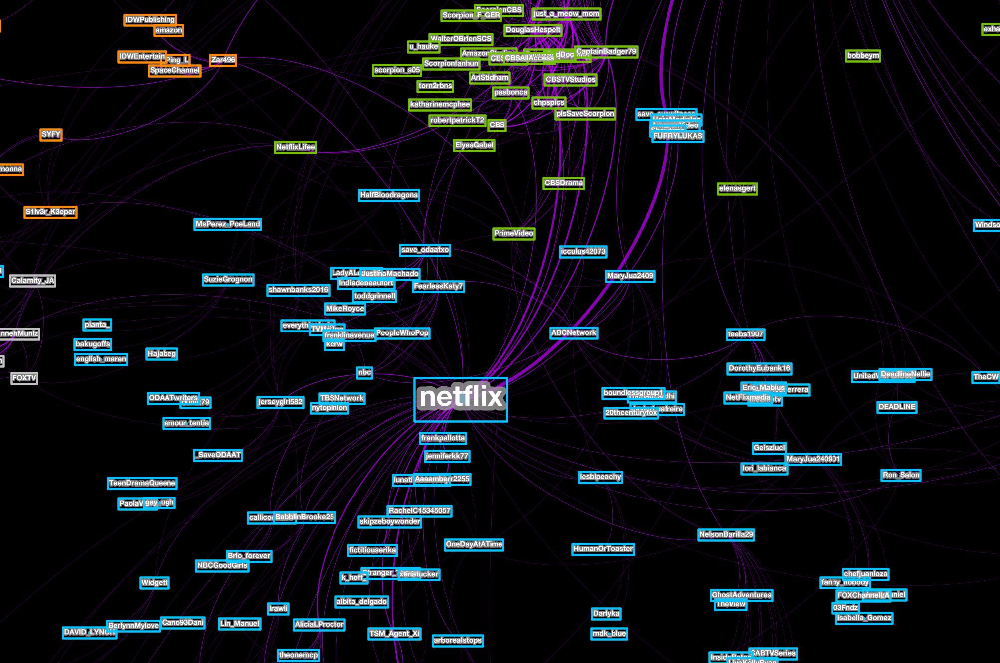

In [171]:
Image(filename='netflix.png', width=800, height=800)

HBO Twitter Mentions Gephi Graph

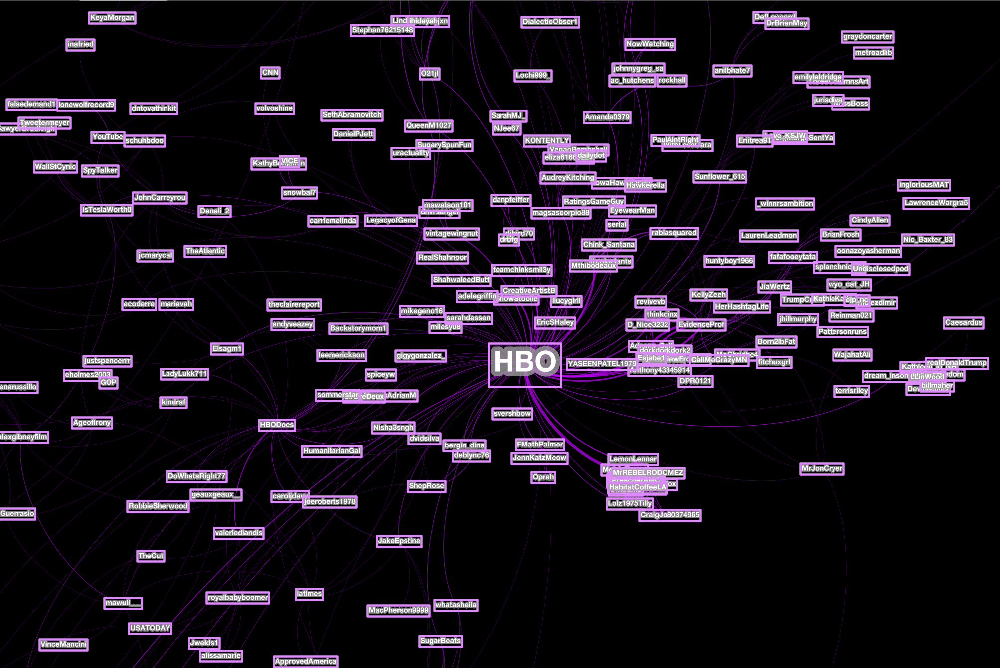

In [172]:
Image(filename='hbo.png',width=800, height=800)

##### Findings and Conclusions via Gephi Graphs

From further inspection of the Gephi graphs, I was able to conclude that the most central users are television networks, television shows, fan accounts, and famous reporters or celebrities. Hulu's top users are "VeronicaMars", "GameOfThrones", "GreysABC", "TheBoldType", and "TimelessFanPHD." Most of Hulu's top users are Twitter accounts for television shows that Hulu regularly streams like Veronica Mars, Greys Anatomy, and The Bold Type. This makes sense because Hulu needs to interact with its most popular TV shows and movies available for streaming via social media to keep the audience engaged about new release dates. Other top Hulu users are fan accounts for specific tv shows like Timeless, a drama series also available on Hulu. While fan accounts tend to have a less impressive number of followers, these followers are hyper-interested in a particular product or TV show, in this case. It would benefit Hulu to reach out to fan accounts via Twitter and offer free trials of new products like live streaming TV in order to increase brand awareness and positive word of mouth. Similarly, another top user for Hulu was the "HuluSupport" Twitter account which provides technical support and updates about streaming outages. While this cluster is smaller, it illustrates an important point that users are reaching out for Hulu's customer support via Twitter. Hulu should ensure they keep this account up to date with any malfunctions or new product feature updates. For Netflix, their top users are "NBC", "TBSNetwork", "ABCNetwork", "PrimeVideo", and "FrankPallotta." Netflix's top users are primarily networks such as NBC and ABC as well as famous reporters like Frank Pallotta for CNN. A surprising top user is Amazon's Prime Video Twitter account. Because Amazon Prime is a competitor to Netflix, it makes sense to see this account as a central user. Lastly, HBO's top users are "Oprah", "ShepRose", "SarahDessen", "AdeleGriffin" and "HBODocs." HBO's top users are surprisingly more different than the top users for Netflix and Hulu. While one of the top users is HBO's documentary Twitter account, the other users are either famous authors such as Sarah Dessen and Adele Griffin, or television celebrities like Oprah and Shep Rose. This could indicate that HBO may have a film adaptation of these author's books in the works. The most important bridgers for all three accounts are competitors and other networks such as "Amazon", "CNN", "CBS", "PrimeVideo", and "CBSTVStudios." Because these three brands are each others top competitors, the most important bridgers are other competitors in this space such as Amazon and Prime Video or television networks that are providing the rights to streaming on Hulu, Netflix, or HBO such as CBS or CNN.

### 2. Semanic Network Analysis

In [173]:
#Import necessary packages for semantic analysis
import nltk
wn = nltk.WordNetLemmatizer()
ps = nltk.PorterStemmer()
import glob
import os
import re
import shutil
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
import csv
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()
import string
import itertools
import zipfile
import json
punctuation = string.punctuation
stopwordsset = set(stopwords.words("english", "spanish"))
stopwordsset.add("'s")

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/alch5988/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/alch5988/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/alch5988/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [174]:
#Removing urls from Tweet text string
def removeURL(text):
    result = re.sub(r"http\S+", "", text)
    return result
#Extracting contextual words from a sentence
def tokenize(text):
    #lower case
    text = text.lower()
    #split into individual words
    words = word_tokenize(text)
    return words
def stem(tokenizedtext):
    rootwords = []
    for aword in tokenizedtext:
        aword = ps.stem(aword)
        rootwords.append(aword)
    return rootwords
def stopWords(tokenizedtext):
    goodwords = []
    for aword in tokenizedtext:
        if aword not in stopwordsset:
            goodwords.append(aword)
    return goodwords
def lemmatizer(tokenizedtext):
    lemmawords = []
    for aword in tokenizedtext:
        aword = wn.lemmatize(aword)
        lemmawords.append(aword)
    return lemmawords
def removePunctuation(tokenizedtext):
    nopunctwords = []
    for aword in tokenizedtext:
        if aword not in punctuation:
            nopunctwords.append(aword)
    cleanedwords = []
    for aword in nopunctwords:
        aword = aword.translate(str.maketrans('', '', string.punctuation))
        cleanedwords.append(aword)
    return cleanedwords

In [175]:
#Initiate semantic analysis for each file in directory via Lematizer, Tokenizer, RemoveURL, etc. to count unique words
uniquewords = {}
count = 0 

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 == 0:
            print(count)
            
        text = tweetjson['text']
        nourlstext = removeURL(text)
        tokenizedtext = tokenize(nourlstext)
        nostopwordstext = stopWords(tokenizedtext)
        lemmatizedtext = lemmatizer(nostopwordstext)
        nopuncttext = removePunctuation(lemmatizedtext)
        
        for aword in nopuncttext:
            if aword in uniquewords:
                uniquewords[aword] += 1
            if aword not in uniquewords:
                uniquewords[aword] = 1

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000


In [176]:
#Include words that are mentioned over 50 times in Tweets
wordstoinclude = set()
wordcount = 0
for aword in uniquewords:
    if uniquewords[aword] > 50: 
        wordcount += 1
        wordstoinclude.add(aword)

In [177]:
print(wordcount)

973


In [178]:
#Create an edgelist and download to csv file to use for network analysis in Gephi
edgelist = open('semantic.edgelist.for.gephi.csv', 'w')
csvwriter = csv.writer(edgelist)

#header for Gephi to specify there are undirected ties between words
header = ['Source', 'Target', "Type"]
csvwriter.writerow(header)

print('Writing Edge List')

uniquewords = {}
count = 0 

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 == 0:
            print(count)
            
        text = tweetjson['text']
        nourlstext = removeURL(text)
        tokenizedtext = tokenize(nourlstext)
        nostopwordstext = stopWords(tokenizedtext)
        lemmatizedtext = lemmatizer(nostopwordstext)
        nopuncttext = removePunctuation(lemmatizedtext)
        
        goodwords = []
        for aword in nopuncttext:
            if aword in wordstoinclude:
                goodwords.append(aword.replace(',',''))
        
        allcombos = itertools.combinations(goodwords, 2)
        for acombo in allcombos:
            row = []
            for anode in acombo:
                row.append(anode)
            row.append('Undirected')
            csvwriter.writerow(row)
edgelist.close()

Writing Edge List
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000


##### Semantic Network Graph for Hulu, Netflix, and HBO via Gephi

Overview of Semantic Network Graph for Hulu, Netflix, and HBO

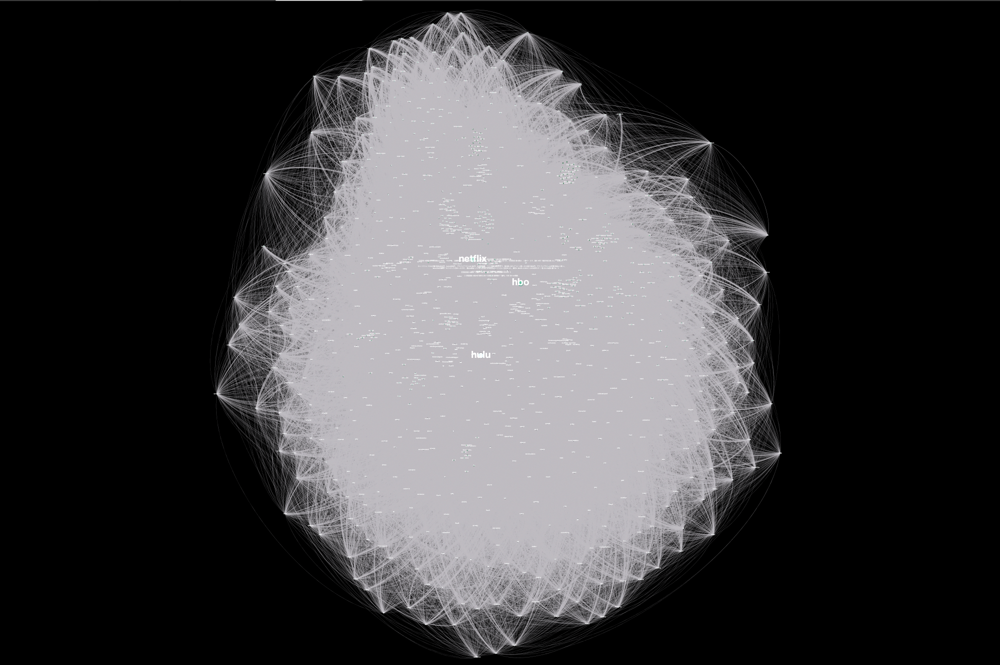

In [184]:
Image(filename='semanticoverview2.png',width=800, height=800)

Hulu Semantic Network Gephi Graph

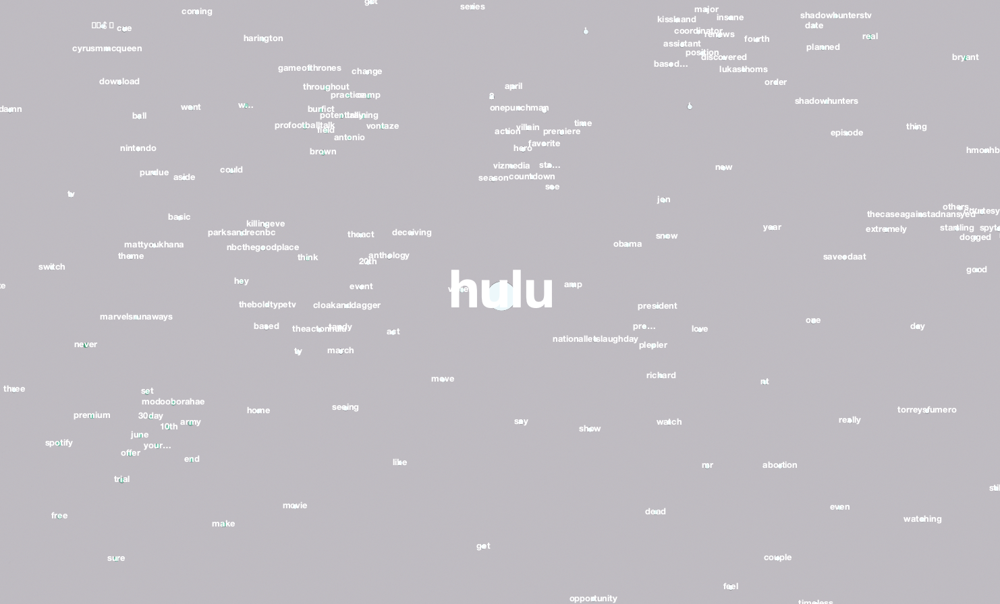

In [186]:
Image(filename='semantichulu.png',width=800, height=800)

Netflix Semantic Network Gephi Graph

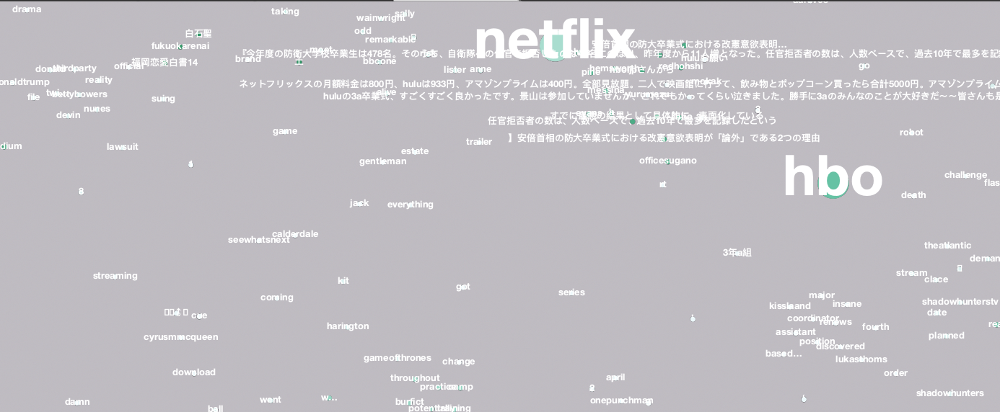

In [188]:
Image(filename='semanticnetflix.png',width=800, height=800)

HBO Semantic Network Gephi Graph

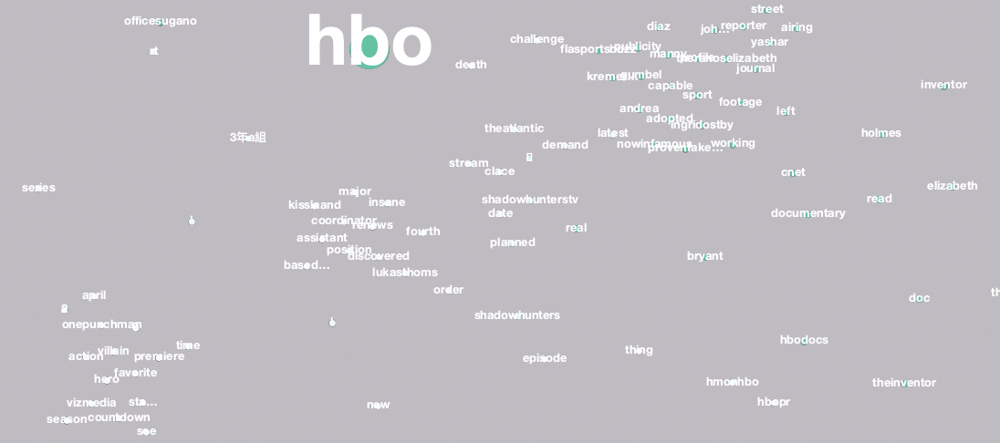

In [187]:
Image(filename='semantichbo.png',width=800, height=800)

##### Findings and Conclusions via Gephi Graphs

From the Semantic Network Gephi Graphs above, the most popular word clusters are television shows, movies, documentaries, and actors and celebrities that are related to the streaming content that is provided by Hulu, Netflix, and HBO. HBO original documentaries such as "The Inventor" and Hulu original TV shows like "The Handmaid's Tale" and Netflix original movies like "The Kissing Booth." The word clusters seem to follow a consistent pattern of revolving around original content and new releases related to the three brands. The attributes that are unique to each brand also follow this pattern. Original content produced by each brand is what is driving the buzz and brand awareness online. Some bridging words include "episode", "show", "series" and "trailer". Other bridging words include themes and categories like "drama" and "love" which are most likely how the product offerings are categorized by these three brands. These are bridging words because there are words that each brand and users Tweet regularly as they apply to the product offerings all three brands. 

### 3. Preprocess Parts of Speech Using Spacy

Using Spacy package ( https://spacy.io/ ), I preprocessed parts of speech to divide Tweets into variables such as nouns, verbs, and pronouns.

In [181]:
import spacy
import pandas as pd

In [182]:
#Create Spacy Function
def spacy_function( ):
    for fn in os.listdir(TMPDIR):
        fn = os.path.join(TMPDIR, fn)
        
        with open(fn) as f:
            tweetjson = json.load(f)
            count += 1
            if count % 1000 == 0:
                print(count)
        
        text = tweetjson['text']
        doc = nlp(text)
        
        for entity in doc.ents:
            print(entity.text, entity.label_)
            print("Noun phrases:", [chunk.text for chunk in doc.noun_chunks])
            print("Verbs:", [token.lemma_ for token in doc if token.pos_ == "VERB"])

In [183]:
# Load English tokenizer, tagger, parser, NER and word vectors
nlp = spacy.load("en_core_web_sm")

spacy_df_blank = pd.DataFrame()
count = 0 

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 == 0:
            print(count)
# Process whole documents        
        text = tweetjson['text']
        doc = nlp(text)
# Analyze syntax       
        #print("Noun phrases:", [chunk.text for chunk in doc.noun_chunks])
        #print("Verbs:", [token.lemma_ for token in doc if token.pos_ == "VERB"])        
# Find named entities, phrases and concepts       
        for entity in doc.ents:
            print(entity.text, entity.label_)

HBO ORG
HBO ORG
Labuhanbatu H. Andi Suhaimi Dalimunthe Hadiri Zikir Akbar PERSON
Panai Hulu PERSON
INSANE ORG
Netflix ORG
Love Death &amp ORG
Robots ORG
Hulu PERSON
’m PERSON
ScienceFiction ORG
the final season of the DATE
HBO ORG
Game o… WORK_OF_ART
Netflix ORG
@hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Jessie Deeter ORG
@HBO ORG
The Inventor: WORK_OF_ART
Silicon Valley' LOC
@jchatterleyCNN PERSON
de Jon Snow PERSON
Norte PERSON
Veja PERSON
Thursday DATE
night TIME
Gotham ORG
Vanity Fair ORG
HBO ORG
Obama PERSON
Jon Snow PERSON
GameOfThrones MONEY
HBO ORG
Richard Plepler PERSON
Pre PERSON
сервисом CARDINAL
Hulu ORG
3 CARDINAL
15 CARDINAL
Kit Harington PERSON
# CARDINAL
GameofThrones ORG
Variety ORG
Tonight TIME
John Oliver PERSON
HBO ORG
Netflix ORG
Hulu PERSON
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
俺「おけ、いっぱいあるなあ GPE
@gabeaguero7 GPE
@hayleyglyphs CARDINAL
Netflix ORG
US GPE
Hulu ORG
6 CARDINAL
HBO ORG
the last year DATE
INSANE ORG
Netflix ORG
Love Death &

Elizabeth Holmes PERSON
$9 Billion MONEY
Scam - @Inc ORG
NUT ORG
LAPTOP 3 ORG
HULU ORG
5 CARDINAL
NUT ORG
8 CARDINAL
7 CARDINAL
1 CARDINAL
Netflix PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
@HBO Ha PERSON
Monika Lewinsky PERSON
Alvin Oliver PERSON
Last Week DATE
Tonight TIME
John Oliver PERSON
HBO ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Silicon Valley LOC
HBO ORG
Theranos ORG
Elizabeth Holmes PERSON
نزل CARDINAL
St. Perfect’s Day” WORK_OF_ART
@CraveCanada PERSON
@hulu PERSON
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
January DATE
HBO ORG
INVENTOR ORG
Theranos NORP
HBO ORG
the last year DATE
’m ORG
Hunter PERSON
Hunter PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Bitcoin GPE
Guy PERSON
Bitcoin GPE
HBO ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Miranda Richardson PERSON
HBO ORG
Hulu PERSON
April 9 DATE
#Vacature MONEY
Junior Accountmanager Out Of Home PERSON
De Hoppe Group ORG
Tilburg GPE
#FMCG # MONEY
#Te PERSON
3/20 CARDINAL

HULU ORG
HULU ORG
HULU ORG
# CARDINAL
ShawnMendes ORG
#News MONEY
Anime ORG
Anime ORG
April 2 DATE
Hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Elizabeth Holmes PERSON
Stanford ORG
Theranos ORG
billion-dollar MONEY
# CARDINAL
Google ORG
Netflix du PERSON
Netflix PERSON
ローコストならdアニメかHuluが強い気がする NORP
16 CARDINAL
Cutest Co PERSON
# CARDINAL
TripleFrontier ORG
Juego de Tronos' ORG
HBO ORG
6 CARDINAL
’m ORG
#shrill MONEY
Hulu PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Elizabeth Holmes PERSON
Netflix ORG
@hulu ORG
US GPE
Leans NORP
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
Approximately 1.5 minutes TIME
first ORDINAL
HBO ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Google ORG
NEVER ORG
celebrate 15 years DATE
HBO ORG
квест GPE
Игры NORP
Организаторы квеста PERSON
6 CARDINAL
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix_HBO_Hulu_ESPN_YouTube_Pandora_GooglePlay_Music_and_

3年A組 CARDINAL
︎

 PERSON
29人がそれぞれ語る未来を DATE
3年A組だけの卒業式を CARDINAL
本当に、有難うございました。#3A PERSON
#TheInventor MONEY
Monday night TIME
Michael Slovis PERSON
Peter Berg PERSON
#hulu_share MONEY
Hulu ORG
#shrill MONEY
50 CARDINAL
Harry Potter PERSON
Procura GPE
’m ORG
HBO ORG
Israeli NORP
Shtisel ORG
@NBCThisisUs ORG
Papua PERSON
Taman Nasional Cycloop ORG
two CARDINAL
two CARDINAL
❤️ KATE &amp ORG
EMALINE &amp ORG
LUKE &amp ORG
MCQUAID &amp ORG
TYLER &amp ORG
OLIVER ORG
Netflix ORG
Netflix ORG
ten CARDINAL
EINDELOOS REFLECTEREN ORG
Norte PERSON
Veja PERSON
de Jon Snow PERSON
HBO GO ORG
Hulu ORG
@hulu PERSON
# CARDINAL
Timeless ORG
SaveTimeIess MONEY
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
Hulu様‼️ CARDINAL
♀️

 ORG
# CARDINAL
Timeless ORG
Hulu ORG
3 CARDINAL
INSANE ORG
Netflix ORG
Love Death &amp ORG
Robots ORG
monthly DATE
April DATE
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Apple TV ORG
4 CARDINAL
KREISCH PERSON
Defenders GPE
2012 DATE
Bong Hee Han PERSO

one CARDINAL
Meet Arya Stark PERSON
HBO ORG
#hulusellout MONEY
#ad MONEY
Netflix ORG
Canadian NORP
Hormones NORP
Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Игры Престолов WORK_OF_ART
Hulu ORG
Netflix NORP
Love Death and Robots - RUSTED ROBOT PODCAST WORK_OF_ART
238 CARDINAL
#ThePWA # MONEY
@CabralRichy GPE
NotGivingUp MONEY
@Marvel @Disney PERSON
SaveDaredevil ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@HBO Yea PERSON
Jays PERSON
19 year old DATE
@HBO PERSON
7 seasons DATE
2.5 seasons DATE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
4 CARDINAL
#アニメ MONEY
@NorthernMinxx @jkbelisle ORG
60% PERCENT
Hulu ORG
HBO ORG
Netflix ORG
two seasons DATE
Brand S ORG
LYM JDHDJFKSKGKDKSLLG ORG
3 CARDINAL
Gays TM ORG
HBO ORG
Real Time WORK_OF_ART
Andrew Gillum PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Continues ORG
FightForWynonna ORG
WynonnaEarp ORG
Netflix ORG
Barry PERSON
its second season Sunday, Mar. 31 DATE
10

Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
HBO ORG
Elizabeth Holmes PERSON
Google ORG
Stadia GPE
GDC19 MONEY
#SaveODAAT
 MONEY
Elizabeth Holmes PERSON
Romy PERSON
Michelle PERSON
Sorvino PERSON
#TheInventor # MONEY
HBO ORG
Hulu’s ORG
Parte 2 PERSON
Es ORG
@urulokid @DragonsDie1230 @AbbyJohnson @StHelens4Life PERSON
@PPFA ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
@CaitlynSada CARDINAL
Netflix ORG
three CARDINAL
Hulu PERSON
Leaving Hollywood LOC
Harvey Weinstein PERSON
@teamchinksmil3y @KONTENTLY PERSON
@HBO Working PERSON
#SaveODAAT MONEY
Netflix PERSON
HBO ORG
Dirty John PERSON
Netflix PERSON
HBO ORG
John Oliver PERSON
HBO ORG
Queria GPE
HBO ORG
Elizabeth Holmes’s PERSON
HBO ORG
#TheInventor MONEY
50 CARDINAL
Harry Potter PERSON
Procura GPE
Netflix PERSON
Grey’s Anatomy ORG
one CARDINAL
@shawnxniallx @netflix ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
The Dirt WORK_OF_ART
last night TIME
Crue PERSON


2013 DATE
NETFLIX ORG
# CARDINAL
Il Trono di Spade 8 PERSON
HBO ORG
Troni di WORK_OF_ART
Ferro FAC
Hulu Character Feels ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Ty PERSON
Tandy ORG
Scarborough PRODUCT
Cloak &amp ORG
Dagger PERSON
1008 DATE
Donald J. Trump PERSON
third ORDINAL
Devin Nunes GPE
Twi PERSON
Elizabeth Holmes PERSON
HBO ORG
@pesty1079 @hulu ORG
Silicon Valley LOC
tonight TIME
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Por HBO Go   PERSON
HBO ORG
Michael Jackson PERSON
HBO ORG
BBC/ ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
@j1map @AmazonESP Hola PERSON
Desarrollo ORG
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
the day DATE
GRACIAS ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
HBO ORG
Warner Bros PERSON
HBO ORG
Kevin Tsujihara PERSON
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
HBO ORG
Channel 4 ORG
По  ORG
Netflix PERSON
Hulu PERSON
Netflix ORG
HBO ORG
Showtime ORG
HBO ORG
the last year DATE
Fyr

Good morning TIME
the week DATE
# CARDINAL
MondayMotiva ORG
Michael Jackson PERSON
Euro Disney ORG
13 CARDINAL
Irishman NORP
first ORDINAL
Netflix ORG
@hulu GPE
March 20th DATE
HBO ORG
John Oliver PERSON
HBO ORG
Fourth Season https://t.co/zPfB5tmBmQ PERSON
Barry PERSON
its second season Sunday, Mar. 31 DATE
10PM TIME
@HBO ORG
Beto PERSON
Bill Maher PERSON
HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
#Shadowhunters MONEY
3年A組 CARDINAL
︎

 PERSON
29人がそれぞれ語る未来を DATE
3年A組だけの卒業式を CARDINAL
本当に、有難うございました。#3A PERSON
Google ORG
Netflix ORG
Netflix ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
@Scaramucci PERSON
# CARDINAL
BillMahe ORG
HBO ORG
JC Staff ORG
Madhouse ORG
8 CARDINAL
3 CARDINAL
Netflix ORG
Hulu’s ORG
2.7B MONEY
2021 DATE
FierceVideo ORG
@ppgarcia75 Salut   PERSON
Netflix p PERSON
@AbbyJohnson ORG
@PPFA ORG
one day DATE
SaveODAAT MONEY
Anne Lister PERSON
GentlemanJack MONEY
Sally Wainwright PERSON
HBO ORG
"Real Sex WORK_OF_ART
#ThankYou MONEY
#JohnOliver # MONEY


First Netflix ORG
Portugal GPE
recent years DATE
2020 DATE
Netflix ORG
HBO ORG
#TheInventor ORG
Elizabeth Holmes PERSON
Theranos PERSON
MJ Estate ORG
John Oliver PERSON
Bill Maher PERSON
# CARDINAL
@hulu GPE
five CARDINAL
Hulu ORG
#hulu # MONEY
Netflix’s PERSON
April 10th DATE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@VIZMedia GPE
NETFLIX ORG
Smart TV ORG
Netflix ORG
YouTube ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Tonight TIME
John Oliver PERSON
HBO ORG
Shadowhunters MONEY
one CARDINAL
Netflix ORG
HULU ORG
😪 PERSON
Netflix ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
4月18日までやから CARDINAL
フラッシュとレジェンド・オブ・トゥモローの新シーズン見ておかないとね GPE
#TheInventor PERSON
the Silicon Valley LOC
Netflix ORG
Nice HBO Game PERSON
HBO ORG
Theranos/Elizabeth Holmes ORG
Emperors ORG
2 CARDINAL
third ORDINAL
the second half of this DATE
Elizabeth Holmes PERSON
IG GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hulu ORG
Assassination Nation ORG
Hulu ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
last ni

HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Theranos PERSON
@JohnCarreyrou ORG
HBO ORG
Inventor ORG
’m PERSON
10 MONEY
Add Hulu PERSON
Papa Hulu PERSON
# CARDINAL
LeavingNeverland ORG
Hulu ORG
’s ORG
CHAMPION ORG
CHAMPION ORG
Antoine Griezmann PERSON
Wife &amp ORG
Kids PERSON
Netflix NORP
Séries CARDINAL
Netflix ORG
Netflix ORG
Blockbuster PERSON
今夜24:59〜日本テレビ系にて放送される GPE
#歌田初夏 さんが出演します MONEY
Netflix ORG
@HBO PERSON
@HBO PERSON
2 CARDINAL
Netflix ORG
2 CARDINAL
#coachsnoop MONEY
仕事から帰って GPE
@AlbertoCiurana ORG
US GPE
# CARDINAL
MariaMagdalena ORG
@HBO ORG
4 CARDINAL
Netflix ORG
de Harry Potter PERSON
de El PERSON
💧 La PERSON
Netflix #Estudio ORG
Netflix PERSON
Theranos ORG
100% PERCENT
HBO ORG
Deuce PERSON
Tonight TIME
John Oliver PERSON
HBO ORG
HBO ORG
Tronos de Ferro PERSON
Game of Thrones WORK_OF_ART
Lemme GPE
HBO ORG
Michael Jackson PERSON
Parent ORG
Yesterday DATE
HBO ORG
Inspiration Room FAC
NYC GPE
this week DATE
’m ORG
2019년 3월 CARDINAL
Warner Bros PERSON
HBO ORG
Kevin Tsujih

Theranos NORP
HBO ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
Netflix PERSON
HBO ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
John Oliver PERSON
HBO ORG
Fox Business ORG
Netflix ORG
Hulu ORG
Huluにタッチがあった ORG
Hulu GPE
# CARDINAL
MJFAM ORG
Leaving Neverland ORG
#hbo #boycothbo MONEY
Amazon ORG
HBO ORG
Elizabeth Holmes PERSON
Tonight TIME
John Oliver PERSON
HBO ORG
’m ORG
#shrill MONEY
Hulu PERSON
Netflix PERSON
’m PERSON
Hulu PERSON
Elizabeth Holmes PERSON
Netflix PERSON
’m ORG
’m PERSON
#SaveODAAT # MONEY
Netflix ORG
next season DATE
Ed Woodward PERSON
Manchester United ORG
Huluを目を凝らして見返したい気持ちはあるけど、簡単に観れるようなものじゃないから心の整理がつかない ORG
♀️ ORG
Berenang PERSON
Bersakit NORP
Malah GPE
HBO ORG
last night TIME
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
@AbbyJohnson ORG
@PPFA ORG
Killer PERSON
Netflix PERSON
Brene Brown PERSON
Netflix PERSON
April 19 DATE
50 CARDINAL
Harry Potter PERSON
Pr

@netflix @OneDayAtATime PERSON
4 CARDINAL
@DAVID_LYNCH &amp ORG
Werner Herzog FAC
America GPE
# CARDINAL
😭 ORG
Tirei Theo Crain PERSON
A Maldição da Residência Hill WORK_OF_ART
Como Theo PERSON
Brad PERSON
Tolongla PERSON
BS ORG
RT @carlafowler16 ORG
Day 25 DATE
#PushupsForWynonna MONEY
@WynonnaFans NORP
@WynonnaEarpPod 

 PERSON
#FightForWynonna # MONEY
HBO ORG
Elizabeth Holmes PERSON
Elizabeth Holmes PERSON
Romy in Romy &amp ORG
Michelle PERSON
’s High School ORG
#hbo MONEY
Favorite Netflix PERSON
3 CARDINAL
Stadia GPE
Netflix de Google ORG
@ShadowhuntersTV ORG
# CARDINAL
Google ORG
Netflix-like Stadia ORG
#strangerthings MONEY
# CARDINAL
#福田愛依 さんがロケしていますよ MONEY
16 CARDINAL
Cutest Co PERSON
Netflix ORG
Las PERSON
Marvel PRODUCT
Zendaya GPE
the next 13 DATE
Netflix Cancels PERSON
They Can’t Move To New Homes WORK_OF_ART
@Liandra82 @TheActBrasil PERSON
Hulu PERSON
Hulu PERSON
#uverworld男祭り MONEY
last week's DATE
BBFC/Netflix ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
tonight TIME


# CARDINAL
# CARDINAL
#PerthSaintSation MONEY
По  ORG
Main Street Tavern FAC
Montevallo GPE
TheDevilAlltheTime ORG
TomHolla ORG
20 CARDINAL
Netflix PERSON
Nordic PERSON
HBO ORG
Prequel PERSON
2021 CARDINAL
Half CARDINAL
The Inventor: Out for Blood in WORK_OF_ART
Silicon Valley LOC
@HBO ORG
OMG ORG
# CARDINAL
BlackSummer ORG
The Yale Stress Center ORG
@HBO ORG
HBO ORG
One CARDINAL
one day DATE
Google ORG
Netflix-like Stadia ORG
Hulu ORG
Netflix ORG
2:27 p.m. TIME
Sunday DATE
Chinese NORP
50 CARDINAL
Harry Potter PERSON
Procura GPE
HBO ORG
14 CARDINAL
Netflix ORG
@UOLEconomia @UOL ORG
Hulu’s ORG
Elizabeth Holmes PERSON
Forbes ORG
4.5 MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
3 dan QUANTITY
Kg Serigala Sg Sel GPE
1986 DATE
Scotch Whisky PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
# CARDINAL
Народ GPE
HBO ORG
6 CARDINAL
Если PERSON
Apple ORG
#@8020es MONEY
#e- MONEY
Netflix Originals' PERSON
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
four minutes TIME
Theranos

Conheça Ragnarok PERSON
100% PERCENT
3 CARDINAL
Herman PERSON
Netflix PERSON
3.0 CARDINAL
SD ORG
5.0 CARDINAL
#News MONEY
Anime ORG
Anime ORG
April 2 DATE
Hulu ORG
HBO ORG
Netflix ORG
Elizabeth Holmes PERSON
Mark Zuckerberg PERSON
The Cult Of Personality ORG
Silico GPE
Netflix ORG
Arrested Development ORG
HBO ORG
Hulu Selangor PERSON
20 CARDINAL
KUALA KUBU BHARU ORG
HULU SELANGOR ORG
HBO ORG
Apple ORG
Spotify PERSON
Hulu PERSON
HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Game of Thrones WORK_OF_ART
15 April DATE
HBO ORG
NexFriend ORG
’m PERSON
Colin PERSON
Md AG ORG
Justice ORG
Maryland GPE
# CARDINAL
ShawnMendes ORG
billion-dollar MONEY
#Shadowhunters MONEY
ShadowhuntersChat ORG
Google ORG
XBO ORG
Netflix PERSON
BRUTAL ORG
68 CARDINAL
Ribu Surat Suara ORG
Indragiri Hulu Tidak Bisa Digunakan FAC
Irish NORP
@hulu ORG
HBO ORG
Arrêté ORG
d'un million CARDINAL
Netflix PERSON
Spotify NORP
WickedGen NORP
21 CARDINAL
"Love, Death &amp WORK_OF_ART
Robots ORG
Netflix PERSON
Jime PERSON

Anya Taylor-Joy to Star PERSON
Netflix GPE
Godless PERSON
Hulu ORG
Path GPE
’m ORG
☝🏾 LOC
Hulu ORG
Sony ORG
SaveODAAT MONEY
# CARDINAL
¿Por PERSON
Justin Webster PERSON
MuerteenLeón ORG
#hulu_share MONEY
Hulu ORG
Aidy Bryant ORG
2 CARDINAL
Hulu GPE
April 9 DATE
the month DATE
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
Netflix ORG
احداث PERSON
Kit Harington PERSON
HBO ORG
# CARDINAL
Demand GPE
HBO ORG
HuluでガンダムWがもうすぐ観れるようになるらしい ORG
HBO ORG
John Oliver PERSON
de Netflix PERSON
the day DATE
t@ggedシーズン2の配信ありがとうございました！再びリクエスト失礼します GPE
😔😔😔😔 PERSON
Netflix ORG
HBO ORG
Rebelde en Netflix ORG
# CARDINAL
OS ORG
MELHOR ORG
2 CARDINAL
Adnan GPE
HBO ORG
Michael Jackson PERSON
two CARDINAL
HBO ORG
Oprah PERSON
Sky ORG
Sky PERSON
Netflix &amp ORG
Estaba GPE
HBO ORG
Lejos de causarme PERSON
de México PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
first ORDINAL
HBO ORG
Gentleman Jack PERSON
19th-century DATE
Area Cheras PERSON
Hulu Langat GPE
Serdang GPE
The Cool Kid

HBO ORG
WomensHistoryMonth ORG
@miri_1001 PERSON
one CARDINAL
HBO ORG
Netflix ORG
Brasil ORG
EUA ORG
Miami GPE
Theranos ORG
15 CARDINAL
HBO ORG
# CARDINAL
WynonnaEarp ORG
BBC/ ORG
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
HBO ORG
2015 DATE
Gabriel Beristain PERSON
Christopher Misiano PERSON
New Yorkers NORP
tonight TIME
@HBO PERSON
Pratt 😂 FAC
BOOM ORG
Vea… PERSON
Desperate Housewives ORG
de Netflix PERSON
ElizabethHolmes ORG
¿Por PERSON
Netflix ORG
Cannes ORG
La GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
season 3 DATE
# CARDINAL
ShawnMendes ORG
Estoy PERSON
I Just Got Hooked On WORK_OF_ART
#MustWatch # MONEY
# CARDINAL
ODAAT ORG
Viewer PERSON
Netflix ORG
@ceoundergroundl Second ORG
Hulu ORG
every day DATE
two days DATE
Theranos ORG
Elizabeth Holmes PERSON
HBO ORG
Inventor ORG
Netflix PERSON
@hulu PERSON
EUA ORG
MC Donalds ORG
BK ORG
Nike ORG
Netflix ORG
Amazon GPE
Twitter GPE
Ed Edd n Eddy PERSON
Mandy ORG
@hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
50 CARDINAL
Harry P

VPN de EEUU ORG
de Netflix PERSON
Infinity War EVENT
Bajen OpenVp PERSON
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
😊 GPE
Google Tak ORG
Netflix/Spotify ORG
Si HBO PERSON
Carlos Trejo PERSON
# CARDINAL
Malec ORG
# CARDINAL
SaveShadowhunters ORG
Malec ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Jon Snow PERSON
Norte PERSON
HBO GO ORG
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
UI ORG
America GPE
May DATE
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
@HBO ORG
Elizabeth Holmes PERSON
Theranos PERSON
last night TIME
Damn Netflix PERSON
🤩🤩 PERSON
дата DATE
Theranos NORP
HBO ORG
Holmes PERSON
Zuckerberg PERSON
the day DATE
one CARDINAL
WOM ORG
@KrystinaArielle PERSON
Hulu ORG
FIRE &amp ORG
ICE ORG
#GameofThrones MONEY
MotherofDragons ORG
Netflix GPE
Hulu PERSON
Arrested Development ORG
HBO ORG
Area Cheras PERSON
Hulu Langat GPE
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
G

Netflix PERSON
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
US GPE
Hulu GPE
UK GPE
Netflix ORG
HBO ORG
Tronos de Ferro PERSON
Game of Thrones WORK_OF_ART
5000
the Puppy Bowl WORK_OF_ART
Hulu PERSON
Google ORG
NEVER ORG
HBO ORG
Elizabeth Holmes PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Netflix Opus Is Totally Insane PERSON
HBO ORG
Elizabeth Holmes PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
GRACIAS ORG
RT @HBO ORG
FOMO ORG
# CARDINAL
second ORDINAL
second ORDINAL
@HBO ORG
Hae's Car WORK_OF_ART
Čtyři PERSON
⏳ ORG
Velké ORG
15 CARDINAL
HBO GO ORG
1 CARDINAL
7 CARDINAL
Damian Lillard PERSON
Netflix ORG
@dadwroteaporno Q PERSON
the new season DATE
3 CARDINAL
2016 DATE
Donald J. Trump PERSON
third ORDINAL
Devin Nunes GPE
Twi PERSON
RT @paintitmalec ORG
# CARDINAL
Netflix 🙌 PERSON
@HBO PERSON
Wade Robson PERSON
first ORDINAL
Nintendo Switch ORG
over 2 years DATE
Basic White &amp ORG
Basic Bla ORG
H

@ferpalazuelosz ORG
Life - Vocês Vão Ter de Me Engolir ORG
AfterLife MONEY
@SSantiagosegura ORG
🏻‍♂️ ORG
2 hours TIME
@HBO PERSON
Theranos &amp ORG
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
Adam Muto PERSON
Cole Sanchez NORP
Rebecca Su PERSON
Fortune ORG
NYT ORG
HBO ORG
Estaba GPE
HBO ORG
Netflix ORG
@An_TheCucco Es PERSON
Netflix ORG
HBO ORG
Amazon ORG
Jo PERSON
El FBI ORG
Michael Jackson PERSON
de HBO PERSON
HBO ORG
Bernadette Aulestia PERSON
？ GPE
Lisa Vidal PERSON
3年A組 CARDINAL
︎

 PERSON
29人がそれぞれ語る未来を DATE
3年A組だけの卒業式を CARDINAL
本当に、有難うございました。#3A PERSON
Elizabeth Holmes PERSON
Alex Gibney PERSON
HBO ORG
The Inventor WORK_OF_ART
Hulu ORG
Mine PERSON
5 months 6 days DATE
Google ORG
Stadia GPE
GDC19 MONEY
Niedawno PERSON
Frankie PERSON
Grace PERSON
Jane The Virgin PERSON
"Love, Death &amp WORK_OF_ART
Robots ORG
Netflix PERSON
Apple ORG
Netflix 🙏 ORG
last night TIME
Hulu ORG
MJ ORG
MJ PERSON
Apple ORG
Apple TV ORG
SaveODAAT MONEY
about # MONEY
DerryGirls ORG
# CARDINAL
#hulu

DAVE ROBSON PERSON
JAMES SAFECHUCK PERSON
HBO ORG
John Oliver PERSON
3年A組 CARDINAL
︎

 PERSON
29人がそれぞれ語る未来を DATE
3年A組だけの卒業式を CARDINAL
本当に、有難うございました。#3A PERSON
HAN ORG
NO ES UN SIMULACRO ORG
REPITO ORG
NO ES UN SIMULACRO ORG
Netflix ORG
@hulu ORG
Game of Thrones ORG
month DATE
Love, Death, And Robots on Netflix WORK_OF_ART
Nasa ORG
TAPI ORG
Menangis PERSON
RT @HBO ORG
RT @renew_gypsy ORG
Sony ORG
SaveTimeless ORG
NEW ORG
@ShadowhuntersTV ORG
# CARDINAL
Huluで「伊豆の踊子 ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Berenang PERSON
April DATE
Huluで「大都会 GPE
Netflix PERSON
BRUTAL ORG
Hulu PERSON
April 9 DATE
@hulu ORG
Elizabeth Holmes PERSON
#TheInventor PERSON
# CARDINAL
LeavingNeverland ORG
Desmontando GPE
de HBO PERSON
Con Fei Rock PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
MJ Estate ORG
Hulu Character Feels ORG
Herman Tømmeraas PERSON
David Sjøholt PERSON
Theresa Eggesbø PERSON
Fyre Festival" WORK_OF_ART
Netflix PERSON
Netflix GPE
Chess Prodigy Series EVENT
2019-03-19 14:04:49 DATE

@RybieMagoo Sorry PERSON
Tim PERSON
Autoplay ORG
Arrested Development ORG
HBO ORG
Huluさんの発表を待つしか、、、 ORG
Warner Bros PERSON
HBO ORG
Kevin Tsujihara PERSON
Ray Romano PERSON
Paddleton WORK_OF_ART
Peruvian NORP
# CARDINAL
15 MONEY
’m ORG
Hulu PERSON
10 MONEY
John Carreyou PERSON
Bad Blood” &gt WORK_OF_ART
ABC Rebecca Jarvis’s ORG
The Dropout” &gt;&gt ORG
HBO ORG
#TheInventor” MONEY
@steve228uk Netflix's PERSON
first ORDINAL
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
Theranos ORG
@JohnCarreyrou ORG
じっくり考えてからお願いしたらちゃんとした円盤を入手できると思います‼️ ORG
Huluで見れなくなるからって焦る必要は全くないんですよ GPE
Hulu PERSON
2 in the morning TIME
Mary J PERSON
@DontKurrr PERSON
Amadi PERSON
#Shrill MONEY
’m PERSON
Aidy Bryant ORG
Netflix y HBO PERSON
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
Netflix ORG
Netflix, Hulu &amp ORG
18 days DATE
the Silicon Valley LOC
@HBO PERSON
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal OR

HBO ORG
# CARDINAL
@nbc @CBS @ABC @hulu PERSON
two CARDINAL
Hulu ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
HBO ORG
Elizabeth Holmes PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
37 CARDINAL
Netflix Cancels PERSON
They Can’t Move To New Homes WORK_OF_ART
El CEO de HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
😞😞 PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
50 CARDINAL
Harry Potter PERSON
Procura GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Fall PERSON
Stirbt Netflix ORG
de Bandersnatch PERSON
Bear Grylls ORG
Sky PERSON
Grace ORG
： CARDINAL
Behind The Curve PERSON
Flat Earth PERSON
#FightForWynonna # MONEY
WynonnaEarp ORG
Nanny PERSON
Netflix PERSON
Michelle PERSON
Hulu ORG
Aidy Bryant ORG
@HBO PRODUCT
# CARDINAL
#NSFW # MONEY
Juego de Tronos PERSON
El Reto ORG
Gran PERSON
Hva PERSON
Røde Kors PERSON
#白石聖 MONEY
Arrested Development ORG
HBO ORG
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
# CARDINAL
@H

HBO ORG
30 days DATE
Ian Fleming PERSON
Netflix ORG
Netflix PERSON
Brené Brown PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Netflixもhuluも急に画質悪くなったなーなぜ？？て色々設定いじってみた後に気づいた、速度制限だわこれ…… ORG
Tuesday DATE
# CARDINAL
Netflix ORG
@HBO ORG
HBO ORG
@JohnCarreyrou ORG
Netflix PERSON
Huluさん、 PERSON
# CARDINAL
Huluお願い ORG
# CARDINAL
本当に本当にお願いします GPE
# CARDINAL
Huluお願い ORG
HBO ORG
HBO ORG
2014 DATE
The Old Grist Mill WORK_OF_ART
Respuesta 5 PERSON
Netflix PERSON
@hulu GPE
March 20th DATE
Elizabeth Holmes PERSON
ドリーム・ガールズ
 ORG
バーレスク
 ORG
# CARDINAL
Hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Elizabeth Holmes PERSON
Theranos NORP
HBO ORG
Aidy Bryant ORG
years DATE
@JohnCarreyrou ORG
Abro Netflix PERSON
El Príncipe de Zamunda ORG
@ryokucha0503 ORG
tonight TIME
@HBO ORG
#superhero # MONEY
# CARDINAL
RT @Daily_Express ORG
Sansa Stark PERSON
#GameOfThrones MONEY
HBO ORG
Confirms Episode Run Times And Dates ORG
The Final Season Of ‘Game Of Thrones WORK_OF_ART
Estaba GPE
HBO ORG
Netflix PER

Netflix ORG
SaveODAAT ORG
Hulu Character Feels ORG
Shrill ORG
Hulu ORG
HBO ORG
HBO Hits PERSON
HBO ORG
CBS Group ORG
1 CARDINAL
128.5 CARDINAL
°E PERSON
Ku Band ORG
10790 CARDINAL
HBO ORG
Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
7 CARDINAL
sixth ORDINAL
S3E6 GPE
Hulu PERSON
YouTubeTV CARDINAL
NETFLIX ORG
Guardia Civil PERSON
Netflix ORG
#Google # MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Hulu PERSON
two CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@Defunctland ORG
Netflix ORG
Hulu PERSON
the History Channel ORG
Elizabeth Holmes PERSON
Steve Jobs PERSON
Enron ORG
Hulu ORG
’m ORG
Hulu/Netflix ORG
Spotify PERSON
Hulu PERSON
2020 DATE
# CARDINAL
@HBO ORG
HBO ORG
え。huluのドクター・フーのシーズン1て、どのシーズン1よ CARDINAL
HBO ORG
» ORG
Канал PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
50 CARDINAL
Harry Potter PERSON
Procura GPE
Trigun ORG
Hulu ORG
HBO ORG
@AlexLecadet GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
#ChauTN MONEY
NETFLIX ORG
Sweaty

HBO ORG
Elizabeth Holmes PERSON
Netflix ORG
six CARDINAL
TheQueensGambit MONEY
Anya Taylor-Joy PERSON
#strangerthings MONEY
HBO ORG
next month DATE
One Day DATE
Time ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
La GPE
#StarTrekDiscovery # MONEY
KeylaDetmer ORG
Planet Earth LOC
Blue Planet LOC
Ne… ORG
Today DATE
a long day DATE
Hulu PERSON
IG GPE
Netflix Cancels PERSON
They Can’t Move To New Homes WORK_OF_ART
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
#ChauTN MONEY
NETFLIX ORG
Pokemon ORG
Sun PERSON
Moon PERSON
Netflix PERSON
April DATE
Netflix ORG
two seasons DATE
Brand S ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@hulu ORG
# CARDINAL
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
Adam Muto PERSON
Cole Sanchez NORP
Rebecca Su PERSON
Hulu ORG
😭💖
 ORG
😭😭 PERSON
永遠流れてて離れたくない PERSON
The Theranos Effect | ORG
Blood FAC
Silicon Valley LOC
Mantan GPE
# CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Esperando GPE
#HakanMuhafız # MONEY
#N

Elizabeth Holmes PERSON
$9 Billion MONEY
Elizabeth Holmes PERSON
#TheInventor PERSON
Lindy West PERSON
HBO ORG
@TinyNukeri @ConnyMikateko PERSON
@BongiWil Papa PERSON
HBO ORG
de HBO PERSON
Mirala PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Silicon Valley LOC
Theranos PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Brasil ORG
EUA ORG
Miami GPE
Obama PERSON
Jon Snow PERSON
GameOfThrones MONEY
HBO ORG
Richard Plepler PERSON
Pre PERSON
# CARDINAL
Hulu ORG
First ORDINAL
Theranos Cast ORG
Hulu ORG
&amp ORG
Arrested Development ORG
HBO ORG
Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
？ GPE
Netflix ORG
Apple TV ORG
Hulu Selangor PERSON
20 CARDINAL
KUALA KUBU BHARU ORG
HULU SELANGOR ORG
# CARDINAL
CuriosidadSeriéfila ORG
La @HBO PERSON
Tronos de Hierro PERSON
@hulu ORG
Fyre Festival EVENT
Silicon Valley LOC
HBO ORG
’m ORG
Netflix ORG
2002 DATE
97 CARDINAL
#selectie #assessment MONEY
HBO ORG
Anne Lister ORG
@SpiceyW ORG
#GentlemanJackHBO premie MONEY
Netflix Or

HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
HBO ORG
Канал HBO PERSON
# CARDINAL
Aaaaaih Sesi PERSON
@ConnyMikateko @quintonizer PERSON
Netflix ORG
@rvoss_nyc @triplefrontier PERSON
Ben PERSON
Netflix la pública PERSON
Este PERSON
Netflix ORG
Disney ORG
NOW ORG
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
# CARDINAL
ShawnMendes ORG
HBO ORG
Elizabeth Holmes PERSON
Hulu ORG
Spotify NORP
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
19/3/19 NORP
Reservoir Dogs PERSON
1992 DATE
@AlphaOmegaSin Google PERSON
La GPE
Formula 1 PERSON
Steve Harrington de "Stranger PERSON
@hulu GPE
March 20th DATE
MJFam ORG
HBO ORG
billions of dollars MONEY
Batman NORP
SaveGotham ORG
WatchGotham ORG
@Gotham PERSON
Indians NORP
Hasan Minhaj Netflix ORG
Indian NORP
Rolls PERSON
Netflix PERSON
HBO ORG
4 CARDINAL
2018 DATE
HBO ORG
Silicon Valley LOC
tonight TIME
HBO ORG
Fourth Season PERSON
Madeleine McCann Netflix PERSON
Kate PERSON
Gerry PERSON
Noooooo 😭 GPE
WTF ORG
@Undisclosedpod 

HBO ORG
the last year DATE
4 CARDINAL
1 CARDINAL
RT GPE
FAV ORG
Rapid TV News - HBO Asia ORG
Asian NORP
NF ORG
Marvel PERSON
Disnεy PERSON
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
HBO ORG
@JohnCarreyrou ORG
2020 DATE
HBO ORG
@JohnCarreyrou ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Saturday, April 27 DATE
@HBO ORG
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
8000
RT GPE
midnight tonight TIME
HBO ORG
de Juego de Tronos PERSON
Cuenta GPE
Cuenta GPE
10% PERCENT
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
Tengo Netflix y Spotify Premium PERSON
¿ GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Purdue ORG
Netflix GPE
Hulu ORG
Hulu ORG
two months DATE
@hulu PERSON
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
#abductedinplainsight MONEY
@HBO’s ORG
🏻‍♀️ ORG
2014 DATE
The Old Grist Mill WORK_OF_ART
HBO ORG
11:59 p.m. TIME
April 8 DATE
GameofThrones MONEY
New York GPE
Hulu ORG

SaveTimeless ORG
@hulu RENEW ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
@HBO ORG
HBO ORG
Inventor ORG
Alex Gibney PERSON
HBO ORG
# CARDINAL
HBO ORG
Elizabeth Holmes PERSON
Leaving Neverland de Dan Reed PERSON
Demoledor PERSON
32 CARDINAL
169 MONEY
40 CARDINAL
199 MONEY
43 CARDINAL
”   PERSON
229 MONEY
50 CARDINAL
299 MONEY
55 CARDINAL
359 MONEY
65 CARDINAL
@HBO ORG
Spectranet ORG
GB ORG
8 days ago DATE
Netflix ORG
US GPE
50 CARDINAL
Harry Potter PERSON
Procura GPE
Hulu ORG
Netflix PERSON
Kit Harington PERSON
@CabralRichy GPE
Annie’s ORG
La GPE
Formula 1 PERSON
Netflix PERSON
2014 DATE
The Old Grist Mill WORK_OF_ART
Brasil ORG
EUA ORG
Miami GPE
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Elizabeth Holmes PERSON
HBO ORG
a week DATE
6 CARDINAL
Elizabeth Holmes PERSON
Theranos PERSON
RT @AltPress ORG
New month DATE
400.000 CARDINAL
Google ORG
Stadia GPE
# CARDINAL
VeronicaMars ORG
@Adnans_Cell OR

Elizabeth Holmes PERSON
# CARDINAL
HBO ORG
@HBO PERSON
Wade Robson PERSON
first ORDINAL
QUWBB ORG
5 pm TIME
HBO PERSON
the Lions Den ORG
Men’s ORG
Netflix PERSON
2015 DATE
Gabriel Beristain PERSON
Christopher Misiano PERSON
Jaime ORG
# CARDINAL
# CARDINAL
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
@Berazateguifran PERSON
HBO ORG
Richard Plepler PERSON
Hulu PERSON
Spotify PERSON
Dennis PERSON
Hulu + Live TV ORG
50 hours TIME
Cloud PERSON
one CARDINAL
first ORDINAL
WynonnaEarp ORG
3 CARDINAL
#FightForWynonna MONEY
@NetflixDE ORG
HBO ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Hulu PERSON
Netflix ORG
six CARDINAL
？ GPE
＃龍オン GPE
Last Week DATE
Tonight TIME
John Oliver PERSON
HBO ORG
#tuesdaythoughts MONEY
3 CARDINAL
#TheDirtMovie # MONEY
MotleyCrue ORG
Netflix ORG
@HBO Game PERSON
Elizabeth Holmes PERSON
Forbes ORG
4.5 MONEY
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Netflix PERSON
HBO ORG
Rome GPE
RT GPE
Season PERSON
2 CARDINAL

WOO HOO ORG
SonicBoom MONEY
Cartoon Network ORG
Boomerang GPE
Hulu ORG
Netflix PERSON
today DATE
Netflix PERSON
Justin Webster PERSON
Marina LOC
#Entrevistas # MONEY
Tuesday DATE
# CARDINAL
the next year DATE
Netflix hour TIME
Gentleman Jack PERSON
BBC ORG
HBO ORG
Suranne Jones PERSON
’m ORG
QueerEye3 PERSON
Netflix PERSON
Queer Eye/Russian Doll ORG
Netflix PERSON
Project Runway PERSON
Hulu PERSON
HBO ORG
John Oliver PERSON
Michael Jackson PERSON
HBO ORG
Deberían NORP
Fox PERSON
#白石聖 MONEY
#studiekeuze #mbo #hbo MONEY
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Netflix PERSON
#TheInventor PERSON
the Silicon Valley LOC
Django de PERSON
😪 PERSON
Josh Malerman PERSON
Esquire GPE
1 de octubre QUANTITY
Fyre Fest PERSON
Love Hate + Robots ORG
TwilightZone ORG
2019 DATE
Juego de Tronos' ORG
HBO ORG
6 CARDINAL
Microsoft ORG
Ganador de la HULU PREMIUM ORG
6 CARDINAL
Horas NORP
50 CARDINAL
Harry Potter PERSON
Procura GPE
@WhismanSucks @HBO Ohmygosh PERSON
# CARDINAL
Inventor ORG
Bill Clinton P

HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Aidy Bryant ORG
Netflix ORG
Launch GPE
America GPE
Nuestro ORG
Salma Hayek PERSON
Boycott Netflix PERSON
Hasan Minhaj PERSON
Narendra Modi ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Netflix ORG
one day DATE
13 CARDINAL
Hulu PERSON
’m PERSON
Netflix ORG
0.30 MONEY
PornHub ORG
$1 MONEY
1.10 MONEY
Spotify PERSON
0.65 MONEY
Spotify PERSON
0.45 MONEY
Hulu PERSON
0.15 MONEY
0.15 MONEY
Netflix/Hulu ORG
HBO ORG
New Series EVENT
Gentleman Jack PERSON
Looks Fun   PERSON
@jezebel ORG
@hulu PERSON
Hulu ORG
Brasil ORG
EUA ORG
Miami GPE
Stadia GPE
Netflix PERSON
NotGivingUp MONEY
#CharlieCox # MONEY
@hulu @Disney PERSON
Netflix PERSON
'The Highwaymen' WORK_OF_ART
Bonnie PERSON
Clyde PERSON
@hasanminhaj   PERSON
Netflix PERSON
BoycottNetflix ORG
Hulu PERSON
Brooklyn 99 FAC
HBO ORG
Elizabeth Holmes PERSON
Brasil ORG
EUA ORG
Miami GPE
#Luciferonnetflix MONEY
’m PERSON
May DATE
Netflix ORG
Vesterosom ORG
’m PERSON
Google ORG
Stadia GPE
Netfli

10 MONEY
Netflix ORG
monthly DATE
Brasil ORG
EUA ORG
Miami GPE
@HBO PERSON
Wade Robson PERSON
first ORDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@rickygervais @netflix Great PERSON
@HBO Drama PERSON
Obama PERSON
Jon Snow PERSON
GameOfThrones MONEY
HBO ORG
Richard Plepler PERSON
Pre PERSON
Elizabeth Holmes PERSON
#TheInventor PERSON
SaveODAAT MONEY
Bear Grylls ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
@danreed1000 @HBO @Channel4 Agreed ORG
# CARDINAL
HBO ORG
GameofThrone ORG
PS ORG
Tonight TIME
Dumbo PERSON
HBO ORG
Michael Jackson PERSON
HBO ORG
Huluで配信されてる『日本統一』シリーズを、ここ数日で1～26まで観てた。実はマンガ喫茶とかのシネマチャンネルで30まで配信されているので何十回も観てるんだけど何回観ても楽しい ORG
HBO ORG
20 CARDINAL
68.5 CARDINAL
@HBO ORG
Winter PERSON
Ustedes PERSON
Famoso ORG
Llega de un PERSON
Netflix PERSON
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
Netflix/Hulu ORG
Jane PERSON
Elizabeth Holmes PERSON
Steve Jobs PERSON
#Scientology ORG
Enron ORG
@pasbonca @DouglasHespelt @BunnyAndDoc PERSON
HB

Netflix ORG
The New Netflix Titles Are Here ORG
Much Good Stuff WORK_OF_ART
@heretv @HereMediaInc PERSON
@HBO @asdfghoneeey PERSON
Annabelle Creation ORG
HBO ORG
Real Time WORK_OF_ART
Andrew Gillum PERSON
Char GPE
2014 DATE
The Old Grist Mill WORK_OF_ART
1 CARDINAL
Harry Potter PERSON
# CARDINAL
ShawnMendes ORG
️#HBO PERSON
RubenBlades ORG
Mira de… PERSON
2 CARDINAL
Leaving Neverland” de HBO WORK_OF_ART
Peter PERSON
Netflix ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
RT @TewChaynz ORG
Temple’s FAC
Netflix PERSON
HBO ORG
HighMaintenance ORG
WynonnaEarp ORG
Netflix ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Elizabeth Holmes PERSON
220 years DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
50 CARDINAL
Harry Potter PERSON
Procura GPE
Shrill ORG
Simon David PERSON
Deuce PERSON
#NationalLetsLaughDay MONEY
Hulu &amp ORG
Rufus PERSON
@malcolmbarrett ORG
RT @elseybarnhart ORG
# CARDINAL
Hulu ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
first ORDINAL
Netflix India PERSON
#SaveODAAT

Hulu Series ' ORG
Planned Parenthood ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
This Elizabeth Holmes PERSON
HBO ORG
HBO ORG
Elizabeth Holmes PERSON
Disney ORG
Fox ORG
Searchlight PRODUCT
Fox Animation ORG
Fox TV ORG
FX ORG
Nationa GPE
Sony ORG
SaveTimeless ORG
NEW ORG
FAT ORG
Hulu Plus ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Norte PERSON
Veja PERSON
de Jon Snow PERSON
HBO GO ORG
Mötley Crüe PERSON
# CARDINAL
TheDirt PERSON
TheDirt PERSON
Faces Places ORG
Netflix ORG
HBO ORG
2015 DATE
Gabriel Beristain PERSON
Christopher Misiano PERSON
Berita PERSON
Seri Kembangan PERSON
Petaling GPE
Hulu Langat GPE
Sepang GPE
# CARDINAL
@OCSTV ORG
HBO ORG
» ORG
Канал PERSON
April DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
#Shrill MONEY
Canada GPE
@CraveTVHelp @hulu PERSON
TheAct 

 ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Nasa Netflix PERSON
A Love Untold WORK_OF_ART
Tatlong KathNiel PERSON
iPhone &amp ORG
@CIA ORG
About 2% PERCENT
VC ORG
# CARDINAL
Estar PERSON
😚💕 PERSON
R

El PERSON
HBO ORG
Bernadette Aulestia PERSON
@kathlee93883549 @ErinLHager @HBO PERSON
Netflixの取材の合間にGoogleの発表の内容を確認。予想通り「サーバー投資額で殴る」パターンで納得 CARDINAL
Netflix PERSON
SaveScorpion MONEY
#TheInventor premieres MONEY
three hour TIME
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
RT GPE
Netflix PERSON
Netflix ORG
4 CARDINAL
One week DATE
@HBO ORG
Friday, March 22nd DATE
Inspiration Room FAC
Instagram NORP
Instagram GPE
@allbins101 PRODUCT
The Fyre Festival of the EVENT
#Shadowhunters # MONEY
SaveShadowhunters ORG
#Letterkenny MONEY
@hulu &amp ORG
@CraveCanada PERSON
approximately 432 more minutes TIME
8 CARDINAL
Calderdale’s ORG
22 April DATE
10pm TIME
# CARDINAL
TripleFrontier ORG
years DATE
Charl PERSON
Michael Jackson PERSON
HBO ORG
Black Friday EVENT
this year DATE
Nakuha GPE
@hulu 99cents ORG
Grosse ORG
Warner ORG
Kevin Tsujihara   PERSON
Kit Harington PERSON
# CARDINAL
GameofThrones ORG
Variety ORG
Christyn Williams PERSON
Star ORG
Hulu ORG


Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Leaving Neverland” de HBO WORK_OF_ART
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
# CARDINAL
VeronicaMars ORG
👀第5話予告映像です ORG
# CARDINAL
Hulu ORG
18 CARDINAL
one CARDINAL
#photoshop MONEY
Aidy ORG
@hulu ORG
Shrill ORG
Jalinan Kasih Sayang PERSON
CSR ORG
JKR Hulu Langat ORG
@RuslanAbdAziz @zarabi ORG
Hulu ORG
そういえばHuluにうる星やつらが全話あるからガンダムばっかり観てるのもなんだしと思ってうる星やつらちょいちょい観てるけどバカバカしくて面白いな。錯乱坊(チェリー)が特に面白い。永井一郎さんいいよな。ガンダムで永井一郎さんの声聞いてもチ CARDINAL
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Munich GPE
@hulu @NetflixD ORG
Theranos NORP
HBO ORG
Ty PERSON
Tandy ORG
#CloakAndDagger MONEY
@Hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
HBO ORG
» ORG
Канал PERSON
HBO ORG
Netflix PERSON
#kdrama # MONEY
morning TIME
TuesdayThoughts ORG
# CARDINAL
Timeless ORG
Nine-Niners ORG
Disney ORG
FOX ORG
next week DATE
71.3B MONEY
2012 DA

Elizabeth Holmes PERSON
#TheInventor PERSON
Spielberg PERSON
Netflix PERSON
#1 MONEY
Sacha Gervasi PERSON
Sacha Gervasi &amp ORG
Sean Macaulay PERSON
HBO ORG
years DATE
@JohnCarreyrou ORG
@CabralRichy GPE
Warner Bros PERSON
HBO ORG
Kevin Tsujihara PERSON
Rihanna PERSON
Lupita ORG
Ava DuVernay ORG
Netflix 👏 PERSON
🏾 #BlackGirlMagic PRODUCT
HBO ORG
HBO ORG
GOT! PRODUCT
90 CARDINAL
Basados PERSON
Two CARDINAL
Tuesday DATE
Toshaway PERSON
the Silicon Valley LOC
#TheInventor premie MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hulu ORG
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
Adam Muto PERSON
Cole Sanchez NORP
Rebecca Su PERSON
Netflix ORG
@Disney &amp ORG
America GPE
Apple ORG
Beyoncé PERSON
’s ORG
Two CARDINAL
One CARDINAL
RT GPE
14 CARDINAL
19 CARDINAL
HBO ORG
@eusouorob Netflix PERSON
Hulu’s ORG
TheAct MONEY
Dee Dee PERSON
Gypsy Rose Blanchard PERSON
Hulu ORG
Elizabeth Holmes PERSON
Theranos NORP
HBO ORG
TheAct 

 ORG
Spotify Premium FAC
Hulu PERSON
Netflix ORG
15.99 M

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
😂😂 FAC
10.92 MONEY
3/18/19 CARDINAL
13.52 MONEY
3/7/19 PRODUCT
two CARDINAL
9 days DATE
Netflix ORG
Fresh Meat ORG
Episodes ORG
3 IN THE MORNING TIME
The Tennessee Kid ORG
Netflix ORG
ONE CARDINAL
#白石聖 MONEY
#strangerthings MONEY
@HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
One CARDINAL
@hulu PERSON
Netflix PERSON
HBO ORG
Brasil ORG
EUA ORG
Miami GPE
Gypsy Blanchard PERSON
Wisconsin GPE
# CARDINAL
Hulu ORG
#AnneListerHome # MONEY
Last Week DATE
Tonight TIME
John Oliver PERSON
HBO ORG
Siren ORG
@Hulu ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
#ChauTN MONEY
NETFLIX ORG
Shrill ORG
first ORDINAL
#TheInventor MONEY
HBO ORG
Kissinger PERSON
ASSASSINATI ORG
Hulu PERSON
Blockbuster PERSON
2 CARDINAL
Cape Town GPE
weekly DATE
The Inventor: WORK_OF_ART
Silicon GPE
tonight TIME
Google ORG
Stadia GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hbo PERSON
Game of Thrones WORK_OF_ART
Lincoln ORG


HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@pokkst NORP
HBO ORG
Michael Marino PERSON
HBO ORG
True Detective WORK_OF_ART
Netflix PERSON
’m PERSON
’m PERSON
@BrunoComerci Yo la vi PERSON
HBO ORG
# CARDINAL
Netflix 
Série PERSON
Michael Jackson PERSON
HBO ORG
#FightForWynonna # MONEY
WynonnaEarp ORG
Elizabeth Holmes’s PERSON
HBO ORG
#TheInventor MONEY
Giovana PERSON
Netflix PERSON
HBO ORG
Joffrey PERSON
@stevano_b ORG
# CARDINAL
MadeleineMccann Netflix ORG
Ku mikisela FAC
Hulu ORG
@ConnyMikateko ORG
#HHW MONEY
Tonight TIME
John Oliver PERSON
HBO ORG
Anne Lister ORG
@SpiceyW ORG
#GentlemanJackHBO premie MONEY
Netflix GPE
Hulu PERSON
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
Losing The Signal WORK_OF_ART
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
# CARDINAL
LethalWeapon ORG
@ClayneCrawford Sets T

♂️🙇 ORG
♂️#みくメール ORG
Netflix’s ORG
HBO ORG
20/20 CARDINAL
La GPE
#Netflix 😎 MONEY
#SaveODAAT # MONEY
HBO ORG
Elizabeth Holmes PERSON
Sub @ultraSel PERSON
Area Cheras PERSON
Hulu Langat GPE
Serdang GPE
Bangi GPE
Kajang GPE
Semenyih GPE
01 CARDINAL
3年A組 CARDINAL
がHuluにて配信されてます ORG
# CARDINAL
Netflix ORG
Roadshow NORP
Netflix April 25 PERSON
ForTheThrone ORG
GoT ORG
Netflix ORG
HBO ORG
#ODAATDeservesBetter MONEY
@Judson1360 ORG
Adnan Syed ORG
HBO ORG
Winter DATE
eighth ORDINAL
Game of Thrones ORG
15 April 2019 DATE
HBO GO ORG
Netflix ORG
Apple ORG
、、、、、 ORG
Assassins Creed Odyssey PERSON
5 seconds TIME
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
’m ORG
Elizabeth Holmes PERSON
Silicon Valley LOC
de Netflix ' PERSON
Robots PERSON
#Cine # MONEY
@moviementarios PRODUCT
RT @ValaAfshar ORG
1865 CARDINAL
Nokia ORG
1889 DATE
Nintendo
 ORG
1876 DATE
1911 DATE
IBM ORG
1928 DATE
Motorola ORG
1938 DATE
Samsung ORG
1939 DATE
HP
 ORG
1946 DATE
Sony ORG
19

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix ORG
’m ORG
@hulu ORG
Twitter LOC
4 CARDINAL
Netflix PERSON
Google Stadia PERSON
Netflix du ORG
Tengo Netflix y Spotify Premium PERSON
¿ GPE
Ty PERSON
Tandy ORG
Scarborough PRODUCT
Cloak &amp ORG
Dagger PERSON
1008 DATE
’m ORG
@hulu ORG
HBO GO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hulu ORG
Netflix PERSON
tonight TIME
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Netflix ORG
Hulu ORG
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
TAKAHIROとかけーじさんよりもひどい事言ってる🤣 PERCENT
Israel GPE
HBO ORG
#TheInventor MONEY
@HBO Oscar PERSON
# CARDINAL
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
NotGivingUp MONEY
@Marvel @Disney PERSON
SaveDaredevil ORG
HBO ORG
Elizabeth Holmes' PERSON
American NORP
8 CARDINAL
HBO ORG
Holmes Documentary PERSON
Libs ORG
Netflix

 PERSON
CIA ORG
Anderson Cooper PERSON
CNN ORG
Donna B… PERSON
HBO ORG
Fourth Season https://t.co/KSDdGLqPYp DATE
#News MONEY
HBO ORG
4 CARDINAL
April DATE
Le

ロミオ PERSON
YESS IM SO ORG
HBO ORG
Hulu PERSON
# CARDINAL
Patricia Arquette PERSON
@PattyArquette ORG
@Hulu GPE
#strangerthings MONEY
Baby PERSON
RT @HBO ORG
MOVIE ORG
all week DATE
Kit Harington PERSON
HBO ORG
# CARDINAL
Netflix PERSON
April 7th DATE
Rolling Stone ORG
Quintis NORP
#SaveScorpion # MONEY
Netflix ORG
Nintendo Switch ORG
over 2 years DATE
Basic White &amp ORG
Basic Bla ORG
@CCforeverRiggs ORG
Tinker MONEY
#Rectify ORG
🤞 PERSON
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Netflix

 PERSON
#SaveODAAT @netflix MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
2014 DATE
The Old Grist Mill WORK_OF_ART
Llevo GPE
Netflix ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
HBO ORG
@TessFowler @KrystinaArielle Nooo PERSON
Hulu PERSON
’s ORG
Europe LOC
# CARDINAL
Commercieel ORG
Nijmegen ORG
40 CARDINAL
Netflix PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 https://t.co/n0MKZXedpL PERSON
Elizabeth Holmes PERSON
Cannes ORG
#SaveOD

50 CARDINAL
Harry Potter PERSON
Procura GPE
Shrill ORG
Hulu ORG
Game of Thrones ORG
Television ORG
HBO ORG
@HBO ORG
GameofThrones ORG
HBO ORG
Matt Murdock PERSON
SaveDaredevil MONEY
Netflix KKKKKKKKKKKKK PERSON
HBO ORG
the last year DATE
HBO ORG
Netflix ORG
Apple ORG
@MailOnline GPE
#HisDarkMaterials MONEY
@BBCOne &amp ORG
@HBO ORG
¿Para PERSON
Nicole Kidman Works PERSON
HBO Series ' EVENT
The Undoing' WORK_OF_ART
Young Co-Star PERSON
Noah Jupe - Just Jared PERSON
La GPE
Formula 1 PERSON
60 days DATE
Hulu GPE
Gentleman Jack PERSON
HBO ORG
April 22 DATE
BBC ORG
@HBO Holmes PERSON
4 CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
SaveODAAT MONEY
GOT ORG
HBO ORG
# CARDINAL
Netflix PERSON
Pratt PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@HBO ORG
Leaving Neverland PERSON
4 CARDINAL
Michael Slovis PERSON
Peter Berg PERSON
Elizabeth Holmes PERSON
HBO ORG
Desa Kampung PERSON
Indragiri Hulu PERSON
@morgan_murphy Watch ORG
HBO ORG
HBO O

Ty PERSON
Tandy ORG
#CloakAndDagger MONEY
@Hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Esta PERSON
Mira de PERSON
#TheInventor premieres MONEY
three hour TIME
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
@FoxTVD @FoxTVStudios @netflix PERSON
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
米HBOの新作コメディで、『Dr ORG
House ORG
Eclaris ORG
#TheGifted #RenewTheGifted MONEY
¿Estás PERSON
HBO ORG
de Game of Thrones WORK_OF_ART
Pruébalo GPE
Leaving Tsujiharaland WORK_OF_ART
Warner Bros PERSON
HBO ORG
# CARDINAL
MJFam ORG
MJTruthSquad MONEY
Bill Maher PERSON
Palestinians NORP
HBO ORG
» ORG
Канал PERSON
Cuenta Random ORG
CAPA OF
 ORG
ORIGIN ORG
HULU ORG
RT GPE
.@Barbie CARDINAL
@hulu ORG
1 CARDINAL
# CARDINAL
MarchAdness ORG
Round 2 LAW
Silicon Valley LOC
HBO ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
’m PERSON
Hulu PERSON
Hbo Go PERSON
Netflix PERSON
Premiere ORG
@SnowStoolie @

今最も楽しみな作品のひとつ！オススメです CARDINAL
50 CARDINAL
Harry Potter PERSON
Procura GPE
¿Estás PERSON
HBO ORG
de Game of Thrones WORK_OF_ART
Pruébalo GPE
Dictionary PERSON
69 CARDINAL
Queer Eye ORG
# CARDINAL
VeronicaMars ORG
tomorrow/later DATE
# CARDINAL
▼ CARDINAL
▼ PERSON
#白石聖 MONEY
HBO ORG
the last year DATE
Netflix GPE
Amazon ORG
The Week of March 18th DATE
4 CARDINAL
Netflix ORG
#YouTube MONEY
# CARDINAL
#Disney MONEY
Amazon ORG
HBO ORG
HighMaintenance ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Netflix PERSON
April DATE
Netflix n WWWHHAAAATTTT PERSON
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
@2901michie Huluってどうなん PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Native Son PERSON
HBO ORG
8 CARDINAL
the Madeleine Mccann FAC
Netflix PERSON
Netflix PERSON
BRUTAL ORG
Hulu PERSON
@angelrodrigo995 Cuando ORG
HBO ORG
Netflix ORG
#福田愛依 さんがロケしていますよ MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
several years DATE
Toonami GPE
Crunchy Roll PE

Hulu ORG
three CARDINAL
Vanderpump ORG
Netflix ORG
HBO ORG
Huluで「dele NORP
Bill Maher PERSON
HBO ORG
two CARDINAL
States GPE
Tax Credits PERSON
HBO ORG
Minn ORG
Bad Blood PERSON
HBO ORG
Donald J. Trump PERSON
third ORDINAL
Devin Nunes GPE
@Google ORG
# CARDINAL
Stadia GPE
Spotify PERSON
Hulu ORG
@steph_palein Lol PERSON
Hulu NORP
HBO ORG
Hulu ORG
SERVE GPE
～ ORG
@echo_nyc @HBO Best ORG
the week DATE
Tuesday DATE
Hulu ORG
NI MONEY
NorthernIreland ORG
IRL ORG
#Ireland GPE
#HBO MONEY
# CARDINAL
ShawnMendes ORG
Netflix ORG
HBO ORG
Showtime ORG
Netflix ORG
Smart TV ORG
Google Home ORG
@rachelnsexton @hulu @lizziethat @RachaelTaylorD2 PERSON
Netflix PERSON
Maryland GPE
HBO ORG
de Juego de Tronos PERSON
# CARDINAL
HBO ORG
BBC ORG
Gentleman Jack PERSON
Acabei de acabar PERSON
Netflix de b99 PERSON
the Silicon Valley LOC
#TheInventor premie MONEY
Lucy PERSON
Wyatt PERSON
#Lyatt # MONEY
Theranos ORG
Киоши GPE
a fourth season DATE
100% PERCENT
Netflix Cancels PERSON
They Can’t Move To New Homes W

HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
# NORP
de Hbo sobre Mj PERSON
Stark PERSON
this April DATE
#GameofThrones # MONEY
HBO ORG
# CARDINAL
ElizabethHolmes ORG
Stick   PERSON
Hulu配信終了するんだ NORP
Netflix ORG
this summer DATE
@HBO PERSON
Ingress: The Animation ORG
April 30 DATE
Galvin ORG
today DATE
Netflix PERSON
RT @miri_1001 ORG
# CARDINAL
Timeless ORG
👏👏👏

 PERSON
10 CARDINAL
Best Sci-Fi Shows PERSON
Hulu ORG
# CARDINAL
SaveTimeless ORG
# CARDINAL
@hulu @ShadowhuntersTV PERSON
Malec😁 PERSON
SaveShadowhunters ORG
Miranda Richardson PERSON
HBO ORG
Game of Thrones ORG
Indian NORP
Hasan Minhaj PERSON
Netflix https://t.co/KJloK1tPI1 PERSON
PERSIDANGAN MAJLIS PERUNDINGAN BELIA ORG
NEG ORG
@ShadowhuntersTV ORG
# CARDINAL
Fat Babe Pool Party ORG
Netflix PERSON
！ DATE
#Huluプレミア『ロック・アップ／スペイン MONEY
4月23日から #Hulu MONEY
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
I Remember You"
Stream it on @hu… WORK_OF_ART
QUE ORG
Notre Planète PERSON
Netflix PERSON
5

RT @lori_labianca ORG
@DorothyEubank16 ORG
two CARDINAL
John Oliver PERSON
Jay Leno PERSON
late night TIME
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Motor GPE
#Netflix MONEY
HBO ORG
John Oliver PERSON
The Tonight Show WORK_OF_ART
Jay Leno PERSON
Kit Harington PERSON
Jon Snow PERSON
HBO ORG
Elizabeth Holmes PERSON
@urulokid @DragonsDie1230 @AbbyJohnson @StHelens4Life PERSON
@PPFA ORG
@SkyTicketDE Wann PERSON
# CARDINAL
Theranos-Doku von @HBO ORG
Euch ORG
Indian NORP
Hasan Minhaj PERSON
Netflix ORG
TheAct 

 ORG
@IanBradleyUK ORG
Netflix ORG
@HBO ORG
GoodGirls ORG
10pm TIME
#FearTWD MONEY
Streaming on @hulu ORG
Grab ORG
Watch HBO PERSON
Fox Movies ORG
Cign ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@NetflixFR Non PERSON
24h DATE
Japon PERSON
Love Death &amp WORK_OF_ART
Nieuwe ORG
Hbo meewerkstage Human Resource Management ORG
#StarTrekDiscovery # MONEY
KeylaDetmer ORG
Wife &amp ORG
Kids PERSON
Netflix NORP
@Equality_Ninja @AustinFlowerBoy @HiTopFilms PERSON
Deadpool PERSON
RT 

#westworld # MONEY
@xBrookeBuchanan Spotify PERSON
4.99 MONEY
Hulu ORG
HBO ORG
HBO ORG
Elizabeth Holmes PERSON
Theranos PERSON
1996 DATE
- Terminamos PERSON
2008 DATE
- Terminamos PERSON
2018 DATE
Terminamos PERSON
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Netflix PERSON
Rick PERSON
🤪 GPE
HBO España PERSON
Ahora me ves… WORK_OF_ART
#Cine PERSON
Brasil ORG
HBO ORG
Lindo PERSON
Jest PERSON
PS ORG
Chodzi PERSON
Shadowhunters ORG
Freeform ORG
Lemme GPE
HBO ORG
Michael Jackson PERSON
Parent ORG
The Stolen Sun &amp ORG
Marvel PERSON
Harvey Weinstein PERSON
de HBO PERSON
HBO ORG
Leaving Neverland PERSON
One Day DATE
Time ORG
HBO ORG
Hulu ORG
Theranos PERSON
Netflix 
 PERSON
@ALB0X | @TheReality21 ORG
23 CARDINAL
Tahap 1 FAC
35 CARDINAL
tonight TIME
@HBO ORG
Netflix’s PERSON
April 10th DATE
First ORDINAL
HBO ORG
GoT ORG
ABS-CBN ORG
tonight TIME
FUMIYAM ORG
@TeaPainUSA PERSON
Trump ORG
eight billion dollars MONEY
#TheInventor premieres MONEY
three hour TIME
American NORP

4 CARDINAL
Love Death + Robots ORG
Netflix ORG
Hulu PERSON
Aidy Bryant's ORG
Netflix ORG
lollĺl Ku PERSON
Hulu ORG
Malinda ORG
Los Angeles GPE
California GPE
14 days DATE
2nd ORDINAL
HBO ORG
HAN ORG
NO ES UN SIMULACRO ORG
REPITO ORG
NO ES UN SIMULACRO ORG
3年A組 CARDINAL
︎

 PERSON
29人がそれぞれ語る未来を DATE
3年A組だけの卒業式を CARDINAL
本当に、有難うございました。#3A PERSON
HBO ORG
Игры NORP
Spanish LANGUAGE
The Wailing WORK_OF_ART
April DATE
April DATE
@hulu PERSON
# CARDINAL
Venlo ORG
1037428 DATE
#hbo MONEY
#B2B MONEY
#Sales MONEY
#Klantbeheer MONEY
#Commercieel MONEY
This morning TIME
@TheTakeaway FAC
OneDayAtATime MONEY
one CARDINAL
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
@dmbjunky4 @ryancordell PERSON
Esta PERSON
Wooo PERSON
@laurarichards99 @JimClemente PERSON
about # MONEY
Elizabeth Holmes PERSON
Steve Jobs PERSON
Enron ORG
RT GPE
HBO ORG
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
4 CARDINAL
¿Con PERSON
Los creadores de ' PERSON
Netfl

HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
安室ちゃんのドキュメンタリー、ラストライブの円盤化をお願いします PERSON
Huluさんには安室ちゃんのドキュメンタリーを長い間配信してくださったこと感謝しています。簡単なことではないのは分かっていますが、あの貴重な映像が見られないと NORP
#SaveODAAT @netflix MONEY
Anya Taylor-Joy to Star PERSON
Netflix ORG
HBO ORG
Hulu ORG
5 CARDINAL
Avery ORG
one CARDINAL
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@HBO ORG
7 CARDINAL
GameofThrones ORG
@hulu ORG
House ORG
Netflix ORG
Mexico GPE
50 CARDINAL
HBO ORG
Netflix PERSON
Netflix ORG
tonight TIME
KOTH ORG
Hulu ORG
last night TIME
April DATE
HBO ORG
John Oliver PERSON
Canada GPE
Canadian NORP
Devine &amp ORG
Bolt PERSON
one CARDINAL
Netflix PERSON
Extras ORG
HBO ORG
Charleston GPE
Kit Harington PERSON
HBO ORG
# CARDINAL
Netflix ORG
Google ORG
1997 DATE
Search ORG
HBO ORG
20:00 DATE
a few years DATE
@Svrdlin @HBO_CZSK Mě PERSON
Chvílemi ORG
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
Netflix GPE
Hulu PERSON
Aidy Bryant ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DA

Netflix PERSON
Spotify PERSON
Stadia GPE
Hulu ORG
Warner Bros PERSON
HBO ORG
Kevin Tsujihara PERSON
Adam Schiff PERSON
Bill Maher PERSON
HBO ORG
Spotify PERSON
Netflix PERSON
Cómo PERSON
de Google PERSON
Como PERSON
4ta ORDINAL
# CARDINAL
HBO ORG
2 CARDINAL
# CARDINAL
HighMaintenance ORG
Season 4 ORG
HBO ORG
Tem ORG
HBO ORG
Disney/Fox ORG
Netflix Marvel PERSON
これも撮ったのにこっちにあげるの忘れてた← CARDINAL
本当に本当にお願いします GPE
# CARDINAL
Huluお願い ORG
a few years DATE
Tesla/Spacex ORG
Inventor ORG
TSLA ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Berdasarkan PERSON
George R R Martin PERSON
HBO ORG
Netflix 🙏 ORG
Netflix ORG
@SandraZeballos ORG
Los Angeles GPE
Zachary Levi PERSON
TheOneShow PERSON
Chuck PERSON
Netflix anymore PERSON
Roku PERSON
Tubi PERSON
Crackle PERSON
years DATE
@JohnCarreyrou ORG
本当に本当にお願いします GPE
# CARDINAL
Huluお願い ORG
#TheInventor premieres MONEY
three hour TIME
# CARDINAL
Hulu ORG
HBO ORG
Elizabeth Holmes' PERSON
Ameri

QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
@ThiMoiz GPE
HBO ORG
CN GPE
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
Así PERSON
25 CARDINAL
Kim PERSON
Aidy Bryant ORG
@hulu PERSON
Shrill MONEY
Ölümsüz GPE
Hakan PERSON
HakanM ORG
’m PERSON
’m PERSON
40s DATE
every day DATE
Sunday DATE
HBO ORG
Theranos PERSON
HBO ORG
One Day DATE
Time ORG
@karinasburboa @HBO ORG
Netflix PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
today DATE
A Little Respect WORK_OF_ART
HBO ORG
4 CARDINAL
all day DATE
Margaret Whitmer PERSON
this week DATE
Producer ORG
nearly 20 years DATE
Rogers PERSON
Hulu ORG
Greys Anatomy WORK_OF_ART
George R R Martin PERSON
HBO ORG
Obama PERSON
Jon Snow PERSON
GameOfThrones MONEY
HBO ORG
Richard Plepler PERSON
Pre PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
One Day DATE
Time ORG
Brasil ORG
EUA ORG
Miami GPE
Anne Lister PERSON
GentlemanJack MONEY
Sally Wainwright PERSON
@hulu Sorry 😭 PERSON
# CARDINAL
KitHarington PERSON
# CARDINAL
RT GPE
# CARDI

HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Pengkalan Hulu PERSON
Abang GPE
Netflix ORG
HBO ORG
Launch NORP
April 22 DATE
New GPE
Monday DATE
Busco ORG
de HBO PERSON
14 CARDINAL
Netflix PERSON
BRUTAL ORG
Elizabeth Holmes PERSON
#TheInventor PERSON
4 CARDINAL
John Kerry PERSON
HBO ORG
Shadowhunters MONEY
one CARDINAL
a terceira QUANTITY
Nintendo Switch ORG
over 2 years DATE
Basic White &amp ORG
Basic Bla ORG
Thursday DATE
night TIME
Gotham ORG
HBO ORG
2000 DATE
Netflix PERSON
Apple ORG
Netflix ORG
Hulu PERSON
SAM ORG
#SaveODAAT @netflix MONEY
# CARDINAL
MALEC ORG
IM JUST TRYNA WATCH ORG
HULU ORG
HBO ORG
Elizabeth Holmes' PERSON
American NORP
@pleasure_kei やぱネトフリがいいんか〜U-NEXTとHuluとネトフリどれがいいか悩んでた～〜 ORG
Netflix PERSON
GameofThrones ORG
HBO ORG
6 CARDINAL
16000
Elizabeth Holmes PERSON
220 years DATE
NETFLIX ORG
Stranger Things WORK_OF_ART
Half CARDINAL
Netflix Gives PERSON
Queria GPE
HBO ORG
Fourth Season FAC
50 CARDINAL
Harry Potter PERSON
Procura GPE
RT GPE
Season PERSON
2 CARDINAL
April

# CARDINAL
HBO ORG
Al Gore PERSON
Game of Thrones WORK_OF_ART
Lo PERSON
HBO ORG
# CARDINAL
@hulu @Sony PERSON
5 CARDINAL
Gotham ORG
SaveGotham ORG
WatchGotham ORG
4 CARDINAL
#empleo #marketing MONEY
#VoD # MONEY
HBO ORG
de Madrid ORG
One CARDINAL
less than a month DATE
# CARDINAL
# CARDINAL
@7_kumi_9 PERSON
！ CARDINAL
！ CARDINAL
Dark Marvel PERSON
Hulu sh… ORG
Watching Netflix PERSON
tonight TIME
@HBO PERSON
Kenny PERSON
GENTLEMAN JACK PERSON
HBO ORG
Kirain HBO PERSON
HBO ORG
HBO ORG
GOT! PRODUCT
#News MONEY
Anime ORG
Anime ORG
April 2 DATE
Hulu ORG
evening TIME
Netflix ORG
#ChauTN MONEY
NETFLIX ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Hulu ORG
Netflix ORG
The Legend of WORK_OF_ART
Cocaine Island LOC
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
#dragon MONEY
#thedragonprince #ドラゴン王子 # MONEY
#aaravos #netflix #anime #manga # MONEY
8 CARDINAL
HBO ORG
Star-Lord ORG
Infinity War EVENT
🤦 PERSON
♀️🤦 ORG
🤦 GPE
♀️ ORG
♀️ ORG
🤦 GPE
HBO ORG
weekend DATE
# CARDINAL
Sha

50 CARDINAL
Harry Potter PERSON
Procura GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
8 years ago DATE
about $… MONEY
Netflix PERSON
❤ GPE
#TheInventor MONEY
Monday night TIME
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
last night TIME
90mins PERSON
Ages 5 to age 65 DATE
Ty PERSON
Tandy ORG
#CloakAndDagger MONEY
@Hulu ORG
Nine-Niners ORG
@HBO PERSON
Wade Robson PERSON
first ORDINAL
CNN ORG
NBC ORG
MSNBC ORG
ABC ORG
HBO ORG
Sintothemax ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
@brunasancha15 GPE
BAYGON BAYGON BAYGON PERSON
Variety ORG
ESTA ORG
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
Regresen Drake PERSON
HBO ORG
the last year DATE
@monterrey67 GPE
@reclu PERSON
de HBO PERSON
Pokémon SS ORG
Hulu Live ORG
HBO ORG
квест GPE
Игры престолов WORK_OF_ART
Watch HBO PERSON
Fox Movies ORG
Pinoy ORG
2019 DATE
India GPE
@HBO ORG
Google ORG
Stadia MONEY
Netflix de PERSON
Netflix Cancels PERSON
They Can’t Move To New Homes WORK_OF_ART

Netflix PERSON
Stadia GPE
México GPE
HBO ORG
Real Time WORK_OF_ART
Andrew Gillum PERSON
@WSJ LOC
HBO ORG
Theranos ORG
New York GPE
Hulu ORG
Hulu PERSON
Spotify PERSON
Netflix ORG
@HBO PERSON
Wade Robson PERSON
first ORDINAL
80 CARDINAL
80 CARDINAL
80 CARDINAL
90 CARDINAL
90 CARDINAL
100 CARDINAL
Hulu + Live TV ORG
2 CARDINAL
@hulu ORG
@exxonmobil GPE
this morning TIME
GartnerDA MONEY
、、、、

Hulu様、どうか円盤化お願いします ORG
# CARDINAL
# CARDINAL
Billy Taxman PERSON
first ORDINAL
HBO ORG
HBO ORG
22 CARDINAL
Winterfell ORG
HBO ORG
@FreeformTV ORG
@hulu ORG
EVER ORG
HBO ORG
Elizabeth Holmes PERSON
Elizabeth Holmes’s PERSON
HBO ORG
#TheInventor MONEY
Downy Unstoppables ORG
89 CARDINAL
Hulu ORG
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
Netflix Passes PERSON
Apple Video Service ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
@vickiirvin   PERSON
# CARDINAL
ElizabethHolmes ORG
HBO ORG
# CARDINAL
ShawnMendes ORG
Estaba GPE
HBO ORG
Depende PERSON
Hulu PERSO

2000 DATE
Netflix ORG
Blockbuster ORG
50million MONEY
😞 PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
2019 DATE
InComm Partner Alliance ORG
the day DATE
FA ORG
HULU ORG
Dar Fav❤ PERSON
Rt PERSON
Keren ORG
HBO ORG
Clica PERSON
#vivaconosco #series MONEY
# CARDINAL
RT @HBO ORG
RT @HBO ORG
ZERO PERSON
last year DATE
IBM ORG
@hulu PERSON
Enjoy HBO HD PERSON
Fox Movies HD ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
30 days DATE
Ian Fleming PERSON
Michael Jackson PERSON
HBO ORG
1 CARDINAL
10 CARDINAL
HBO ORG
Rome GPE
last week DATE
Arrested Development ORG
HBO ORG
16 CARDINAL
Cutest Co PERSON
Canada GPE
Hulu ORG
a fourth season DATE
Knocks PERSON
Jets PERSON
this summer DATE
One CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
first ORDINAL
TheAct 

 ORG
Google ORG
Netflix ORG
Game Developers Conference https://t.co/NJzfku68x2 WORK_OF_ART
HBO ORG
One day DATE
@farmsofcanada Hey W &amp ORG
@MrX06290341

#LucyInTheSky MONEY
the Space Race FAC
Timeless ORG
Hulu ORG
TimeTeam GPE
@hulu ORG
Netflix PERSON
@MaxFunHQ PERSON
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@hulu ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix ORG
HBO ORG
Season 8 ORG
3 - 1:22 DATE
Xbox PERSON
Netflix PERSON
Hulu PERSON
Hulu Selangor PERSON
20 CARDINAL
KUALA KUBU BHARU ORG
HULU SELANGOR ORG
@HBO Grrrr PERSON
Britain GPE
@rojas3764227582 @baronjimena ORG
70 CARDINAL
Angeli NORP
Puro ORG
@VIZMedia @hulu Aaaaaand PERSON
Madhouse ORG
@so_hulu エサを食べた直後だったからか割とグビグビいってましたね(笑 ORG
Theranos ORG
LGBT ORG
Tales of the City ORG
4 CARDINAL
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
’m PERSON
Netflix n PERSON
Weekend ORG
Bernie’s ORG
a fourth season DATE
Netflix PERSON
Netflix PERSON
HBO ORG
Elizabeth Holmes PERSON
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
Hulu PERSON
April 9 DATE
#AnneListerHome #

Mötley Crüe PERSON
Friday DATE
night TIME
@HBO ORG
Adnan Syed LOC
’m PERSON
one CARDINAL
Elizabeth Holmes PERSON
OMG ORG
Hakan PERSON
Muhafız ORG
Ross Barkley Documentary PERSON
Netflix 👀 PERSON
Kyanna Simpson PERSON
# CARDINAL
ShawnMendes ORG
Tonight TIME
John Oliver PERSON
HBO ORG
three CARDINAL
Netflix PERSON
Amazon ORG
Hulu ORG
@nbc @hulu @PrimeVideo @ABCNetwork ORG
this week DATE
Purdue ORG
Netflix ORG
Hulu ORG
HBO ORG
2 CARDINAL
Hulu Eng ORG
Netflix PERSON
@HBO ORG
@theranos ORG
Elizabeth Holmes PERSON
Netflix à Los Angeles ORG
Tirei Número Cinco de " PERSON
The Umbrella Academy WORK_OF_ART
Netflix PERSON
HBO ORG
Thursday, March 21 DATE
NYC ORG
HBO ORG
Monday, March 25 DATE
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
SaveScorpion MONEY
2 CARDINAL
Today DATE
’s Happy WORK_OF_ART
@Jadyn ORG
La GPE
Formula 1 PERSON
Hulu Chibi PERSON
Hulu PERSON
Spotify Premium FAC
Netflix PERSON
# CARDINAL
ShawnMendes ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Deberia PERSON
Tonight TIME
Jo

HBO ORG
#travelagents MONEY
Amanda Seales PERSON
HBO ORG
KKK ORG
Elizabeth Holmes PERSON
Stanford ORG
Theranos ORG
billion-dollar MONEY
CBS 46 &amp ORG
Astrid Martinez @Astridtv1 PERSON
Killer Mike PERSON
Netflix PERSON
’m PERSON
Hakan ORG
Muhafız ORG
April 26th DATE
Netflix ORG
@cagatayulusoyy GPE
# CARDINAL
ShawnMendes ORG
ISO ORG
Netflix PERSON
Queer Eye ORG
PERO NECESITO SALIR ORG
Netflix ORG
Hulu PERSON
23 CARDINAL
Netflix PERSON
Hulu PERSON
Hulu ORG
Pour PERSON
Hodor GPE
@MACKYBHOY1 PERSON
@shiiichan2525 ORG
@lets_go_mets86 @hulu ORG
Canada GPE
# CARDINAL
#donne MONEY
# CARDINAL
Stadia GPE
Netflix PERSON
HBO ORG
16 CARDINAL
Cutest Co PERSON
Morte de PERSON
Casamento GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@MrX06290341 GPE
Twitter Mad WORK_OF_ART
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Kit Harington PERSON
HBO ORG
Richard Plepler PERSON
GameofThrones ORG
#NationalLetsLaughDay MONEY
Hulu &amp ORG
Rufus PERSON
@malcolmbarrett ORG
RT GPE
Season PERSON
2 CARDINAL
April 9

Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
Michael Slovis PERSON
Peter Berg PERSON
# CARDINAL
ArrestedDevelopment Netflix ORG
#dragon MONEY
#thedragonprince #ドラゴン王子 # MONEY
#aaravos #netflix #anime #manga # MONEY
@hulu PERSON
SaveODAAT MONEY
years DATE
@JohnCarreyrou ORG
1 CARDINAL
Holl GPE
# CARDINAL
AdnanSyed @HBO ORG
Jay PERSON
Warner Bros ORG
HBO ORG
Kevin Tsujihara PERSON
#April14 # MONEY
GameofThrones ORG
595days MONEY
595 days DATE
Netflix ORG
HBO ORG
King of Its 'Game of Thrones' Augmented Reality Promotion at SXSW ORG
@HBO ORG
Monday DATE
El CEO de HBO ORG
Leaving Neverl PERSON
@hulu PERSON
Netflix ORG
😭 PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@HBO Town PERSON
Big PERSON
Beto PERSON
Bill Maher PERSON
HBO ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
@TrogMD Got PERSON
Hook PERSON
Freeform NORP
Kate PERSON
Madeleine GPE
DEAD ORG
#MadeleineMcCann # MONEY
HuluSellout ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@IwanRheon ORG
Hulu PERSON
Tirei Número Cinco

#RealTime @HBO MONEY
Hollywood GPE
Da Hood GPE
Dominic DuPont PERSON
Hollywood GPE
Michael K W PERSON
HBO ORG
Netflix ORG
a month DATE
Thomas Edison PERSON
Elizabeth Holmes PERSON
Vasco ORG
@Google ORG
# CARDINAL
ウィチイトのお兄さんの弟者ぁぁあああ！！！が好きすぎる件 GPE
The Tennessee Kid ORG
Netflix ORG
ONE CARDINAL
Brasil ORG
EUA ORG
Miami GPE
#ノーマンリーダス #Hulu MONEY
Brasil ORG
EUA ORG
Miami GPE
Amy Schumer PERSON
xD XD XD ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
next season DATE
Ed Woodward PERSON
Manchester United ORG
Hulu ORG
Donald J. Trump PERSON
third ORDINAL
Devin Nunes GPE
Twi PERSON
あ〜〜、幸せ PERSON
Elizabeth Holmes PERSON
Mark Zuckerberg PERSON
Hulu PERSON
@bones327 @skijoey ORG
# CARDINAL
ShawnMendes ORG
HBO ORG
Игры NORP
SERVE GPE
a little over a month DATE
the season DATE
April 21st - DATE
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
#VIDEO MONEY
Nuestro ORG
Salma Hayek PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@LindaMJJ50 DATE
@Rosemar

Anya Taylor-Joy PERSON
Star ORG
@Netflix Drama ' PERSON
The Queen's Gambit' From WORK_OF_ART
Scott Frank PERSON
Disney ORG
Netflix https://t.co/BxUcNY3CGN PERSON
Brasil ORG
EUA ORG
Miami GPE
GentlemanJack MONEY
# CARDINAL
AnneLister ORG
Calderdale ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
# CARDINAL
ShawnMendes ORG
Llegué de laburar PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@CaitlynSada @goodyerin PERSON
Tirei Theo Crain PERSON
A Maldição da Residência Hill WORK_OF_ART
Queer Eye ORG
SaveODAAT MONEY
El tremendo ORG
de Theranos PERSON
de Silicon Valley LOC
Donald J. Trump PERSON
third ORDINAL
Devin Nunes GPE
Twi PERSON
HBO ORG
GOT ORG
Amy Schumer Growing' PERSON
today DATE
Netflix ORG
first ORDINAL
Black Summer EVENT
Jaime King PERSON
HBO ORG
the last year DATE
Patricia Arquette PERSON
Attend ORG
@EenVandaag @schoolbureau ORG
HBO ORG
@Disney Disney ORG
the Fox News Channel ORG
Disney ORG
RT GPE
One Day DATE
HBO ORG
# CARDINAL
Google ORG
Stadia MONEY
Netflix de PE

Maryland GPE
Billions PERSON
the Making of Wealth Porn WORK_OF_ART
@rickygervais PERSON
Hulu ORG
！ MONEY
Hailee Steinfeld PERSON
Kyra Sedgwick PERSON
The Edge of Seventeen WORK_OF_ART
Hulu ORG
’m PERSON
the first few days of spring DATE
second ORDINAL
#Egyptian-American actor MONEY
@ramy Youssef’s PERSON
Gentleman Jack PERSON
One CARDINAL
Kickass ORG
Fights Expectations PERSON
HBO ORG
New Series EVENT
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
Netflix GPE
Michael Jackson PERSON
40 CARDINAL
Netflix ORG
Amazon ORG
Hulu https://t.co/eGiqKGY0VE ORG
Netflix PERSON
1 CARDINAL
2 CARDINAL
Hulu ORG
1 CARDINAL
’m PERSON
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
Netflix Madeleine McCann PERSON
McCanns PERSON
CADAVER ORG
Belinda Carlisle's PERSON
Mad About You WORK_OF_ART
HBO ORG
HBO ORG
» ORG
Канал PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
April DATE
Theranos PERSON
HBO ORG
5 hours TIME
# CARDINAL
Malec PRODUCT

Sally Wainwright PERSON
HBO ORG
Gentleman Jack PERSON
40 CARDINAL
Hulu ORG
Exxon ORG
ThoughtSpot ORG
Catch ORG
today DATE
1030 DATE
Canary GPE
Hulu PERSON
ANDROID PHONE ORG
’m ORG
45 minute TIME
ซินซิน เจ้าต๋า ORG
HBO ORG
Elizabeth Holmes PERSON
evening TIME
Beth PERSON
HBO ORG
Michael Jackson PERSON
1 CARDINAL
Netflix GPE
Hulu PERSON
権利上の都合により予定がないだけで、どうにかこうにかしてその予定を作ってください CARDINAL
# CARDINAL
Netflix PERSON
’m PERSON
@hulu GPE
Netflix PERSON
Hulu ORG
# CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
ZH-Rotterdam ORG
Ben PERSON
HBO ORG
first ORDINAL
Hulu ORG
Brian PERSON
Hulu ORG
4th ORDINAL
HBO ORG
Game of Thrones WORK_OF_ART
Netflixやバンダイチャンネル等、配信サイトのバリアフリー字幕も拡大してきましたね ORG
HBO ORG
Elizabeth Holmes PERSON
#RECEHKANTWITTER MONEY
#recehkantwiter MONEY
# CARDINAL
#recehantwitter MONEY
# CARDINAL
CaptainMarvel ORG
Avery ORG
Mashi PERSON
Netflix IMO PERSON
HBO ORG
Hulu PERSON
Blockbuster PERSON
Hbo PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Gracias ORG
100 CARDINAL
Netflix N

HasanMinhaj ORG
Netflix ORG
Tonight TIME
John Oliver PERSON
HBO ORG
Yesterday DATE
Blood, Sweat and Pixels WORK_OF_ART
1 CARDINAL
2 CARDINAL
ODIA ORG
Cristiano ORG
3.- PRODUCT
4 CARDINAL
Google ORG
Netflix ORG
# CARDINAL
Michael Slovis PERSON
Peter Berg PERSON
Madeline McCann Netflix PERSON
Maia ORG
Alpha ORG
first ORDINAL
3 CARDINAL
#Shadowhunters MONEY
Freeform PERSON
#福田愛依 さんがロケしていますよ MONEY
Va GPE
Thriller ORG
2 CARDINAL
the other day DATE
Jackson PERSON
75Million MONEY
Michael Jackson's PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix แล้วไม่รู้จะดูอะไรป่ะ PERSON
Financial Times ORG
Apple ORG
Jackson Estate ORG
HBO ORG
Google PRODUCT
Hulu PERSON
April 9 DATE
US GPE
Arrested Development ORG
HBO ORG
Ty PERSON
Tandy ORG
#CloakAndDagger MONEY
@Hulu ORG
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
Fargo GPE
Ozark GPE
Mindhunter PERSON
Netflix PERSON
Huluまだあるんかな。ただ何故か最終章だけ置いてないからヤキモキすることになるけどw ORG
RT @HBO ORG
Il Trono di Spade 8 P

HBO ORG
@HBO ORG
#TheInventor premiered MONEY
last night TIME
Theranos ORG
Silicon Valley LOC
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
9-1-1 CARDINAL
Hulu ORG
# CARDINAL
GameofThrones ORG
HBO ORG
Iron Throne PERSON
Estaba GPE
HBO ORG
30 days DATE
Ian Fleming PERSON
3x15 CARDINAL
Netflix ORG
1 CARDINAL
50 CARDINAL
Harry Potter PERSON
Procura GPE
Hulu   PERSON
Last Week DATE
Tonight TIME
John Oliver PERSON
HBO ORG
Troll PERSON
4 CARDINAL
Munich GPE
@hulu @NetflixD ORG
@ibrake4ants @Chink_Santana @rabiasquared @HBO PERSON
Bill Maher PERSON
HBO ORG
@HBO ORG
Frida PERSON
Desperado GPE
Netflix GPE
@hulu ORG
DYK ORG
42% PERCENT
Rape Crisis ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
RT @HBO ORG
Brazil GPE
Tengo Netflix y Spotify Premium PERSON
¿ GPE
1 CARDINAL
Sansa Stark PERSON
Winterfell GPE
April DATE
OAN ORG
Fox ORG
1st DATE
BBC/ ORG
David Attenborough PERSON
Netflix PERSON
HBO ORG
HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Hulu S

#TheInventor PERSON
the Silicon Valley LOC
Bad Girls Club ORG
Hulu ORG
Netflix PERSON
Rois Maudits PERSON
à la HBO WORK_OF_ART
Netflix du PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hulu ORG
ClockBlockers ORG
Chronological ORG
The Capture of Benedict Arnold WORK_OF_ART
tonight TIME
RT @Stranger_Things ORG
AlmOst FEeDInG ORG
Hound ORG
YouTube ORG
Hulu ORG
Netflix ORG
the next month DATE
WynonnaEarp ORG
Patricia Arquette PERSON
@PattyArquette ORG
@Hulu GPE
Netflix PERSON
Huluさん、 PERSON
# CARDINAL
Huluお願い ORG
# CARDINAL
Vesterosom ORG
Brexit GPE
Youth &amp ORG
Japan GPE
Mascot PERSON
HBO ORG
HBO ORG
6 CARDINAL
@michaelcollado GPE
HBO ORG
one-hour TIME
GameOfThrones MONEY
Gomorrah PERSON
U.S. GPE
seasons 3 DATE
4 CARDINAL
@Agnes_Unicorn PRODUCT
Igual ORG
HBO ORG
Hbo PERSON
72 CARDINAL
Theranos ORG
2 CARDINAL
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
’m ORG
Netflix PERSO

@fruity_basil 全体的にカバーするなら1番はU-NEXTですがコスト考えるんならNetflixかHuluですね PERSON
Salma Hayek PERSON
Netflix ORG
#Movie #Video #Trailer MONEY
de Madeleine McCann PERSON
SharkTank ORG
first ORDINAL
#hulu MONEY
#mrwonderful MONEY
60% PERCENT
Hulu ORG
▼ PERSON
▼ PERSON
Netflix y PERSON
YA NO ES IMPOPULAR WORK_OF_ART
@curlyyonce Watch After Life PERSON
@TJVRD ORG
Netflix ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Genre PERSON
Netflix PERSON
Hulu PERSON
70 CARDINAL
✝ ORG
# CARDINAL
Hulu ORG
Stadia GPE
4K/60 CARDINAL
Netflix 4K ORG
14 CARDINAL
HBO ORG
Tronos de Ferro PERSON
Game of Thrones WORK_OF_ART
#3A MONEY
#Hulu MONEY
#永野芽郁 # MONEY
Anne Lister PERSON
GentlemanJack MONEY
Sally Wainwright PERSON
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Kit Harington PERSON
# CARDINAL
GameofThrones ORG
Variety ORG
@HBO ORG
Elizabeth Holmes PERSON
Theranos PERSON
last night TIME
Att Netflix PERSON
a little over a month DATE
the season DATE
April 21st - D

Obama PERSON
Jon Snow PERSON
GameOfThrones MONEY
HBO ORG
Richard Plepler PERSON
Pre PERSON
1 CARDINAL
@hulu PERSON
#VeronicaMars # MONEY
Lizzie Kunkle PERSON
14 CARDINAL
Conversations With A Killer: WORK_OF_ART
@AbbyJohnson ORG
@PPFA ORG
a fourth season DATE
Hulu ORG
The Act WORK_OF_ART
Joey King PERSON
Suite Life ORG
Google ORG
NEVER ORG
Hulu + Live TV ORG
HBO ORG
Warner Media ORG
SonicBoom MONEY
Cartoon Network ORG
Boomerang GPE
#SaveODAAT @netflix MONEY
# CARDINAL
AEG ORG
HBO ORG
Sundance ORG
Dan Reed PERSON
HBO ORG
AEG &amp ORG
Yoooo ORG
💗 PERSON
#FearTWD MONEY
Streaming on @hulu ORG
👌 PERSON
DYK ORG
42% PERCENT
Rape Crisis ORG
Tonight TIME
John Oliver  PERSON
HBO ORG
TheAct 

 ORG
Two CARDINAL
1 CARDINAL
States GPE
2 CARDINAL
Google ORG
Clockblockers ORG
#SaveTimeless # MONEY
Parte IX PERSON
Rosadita, DE LAS CAJAS DE LA CRUZ ORG
AL VATICANO ORG
Ló PERSON
Netflix PERSON
😊 GPE
MANIPULADOS ORG
Love, Death &amp ORG
¿Destinada al culto PERSON
@PPFA ORG
Lol Netflix PERSON
@Adnans_Cell O

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Google ORG
Stadia MONEY
Netflix de PERSON
HBO ORG
Jeremy Renner PERSON
Jordan Belfort PERSON
HBO ORG
миру PERSON
Игры NORP
Leaving Netflix PERSON
Ap GPE
Henry Sachs PERSON
กับคุณแม่ ORG
Grace Sachs ORG
Las PERSON
A de Gu PERSON
RT @HBO ORG
HBO ORG
HBO ORG
Elizabeth Holmes PERSON
Netflix PERSON
2 CARDINAL
HBO ORG
Elizabeth Holmes PERSON
#TheInventor MONEY
"Love, Death &amp WORK_OF_ART
Robots ORG
Netflix PERSON
a long week DATE
25 CARDINAL
こういう危機感は、首都圏に住んでいる人達にはほんとうに伝わりにくいかと思う GPE
HBO GO ORG
1000% PERCENT
Misfits - LOC
Hulu ORG
Tonight TIME
John Oliver PERSON
HBO ORG
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
3年A組卒業しました CARDINAL
Netflix PERSON
April 29 DATE
Netflix 15.99 PERSON
Shorty Hulu PERSON
# CARDINAL
ShawnMendes ORG
Netflix ORG
Hulu PERSON
Playstation ORG
# CARDINAL
Google ORG
Gaming ORG
Netflix PERSON
Monday DATE
Lionheart PERSON
Hulu &gt ORG
4 CARDINAL
Gracias ORG
HBO ORG
House of Cards

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Maher PERSON
HBO ORG
Warner Bros. ORG
HBO ORG
HBO GO ORG
398 DATE
Love, Death &amp ORG
Robots PERSON
3:16 Day DATE
Broken Record Pod PERSON
#Hulu MONEY
HBO ORG
Girls ORG
Netflix PERSON
Sun PERSON
Moon Season 2 PERSON
Netflix PERSON
Tonight TIME
John Oliver PERSON
HBO ORG
Brasil ORG
EUA ORG
Miami GPE
Aidy Bryant ORG
daily DATE
# CARDINAL
#kihyun MONEY
Brasil ORG
EUA ORG
Miami GPE
@ArianaGrande @GOT7Official PERSON
@giphy ORG
Area Cheras PERSON
Hulu Langat GPE
Serdang GPE
50 CARDINAL
Harry Potter PERSON
Procura GPE
JÁ PERSON
지친나머지 010-4444-4444에 CARDINAL
April DATE
American NORP
Extended Version of ‘Hateful WORK_OF_ART
Eight CARDINAL
spring DATE
HBO ORG
temporada de Game of Thrones WORK_OF_ART
Steven Spielberg PERSON
Netflix Originals PERSON
Oscar GPE
’m ORG
Netflix ORG
Netflix PERSON
HBO ORG
Theranos ORG
Elizabeth Holmes PERSON
$9 billion MONEY
#TheInventor MONEY
HBO ORG
Real Time WORK_OF_ART
Andrew Gillum PERSON
Mungkin Inilah PERSON
😭😭 ORG


Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
# CARDINAL
@HBO ORG
HBO ORG
Elizabeth Holmes PERSON
Hulu ORG
Netflix PERSON
Hulu ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Ray PERSON
# CARDINAL
WarnerMedia ORG
#Comcast are question marks MONEY
Game of Thrones/ WORK_OF_ART
HBO ORG
King of Its 'Game of Thrones' Augmented Reality Promotion at SXSW ORG
100 CARDINAL
Rogue One ORG
Last Jedi PERSON
#DLMChallenge # MONEY
Hulu ORG
CUENTA DE QUE ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Melissa Cobb PERSON
April DATE
The90sInAGif MONEY
80s DATE
GIF ORG
Timeless ORG
Hulu ORG
TimeTeam GPE
50 CARDINAL
Harry Potter PERSON
Procura GPE
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@HBO PERSON
Wade Robson PERSON
first ORDINAL
Google ORG
Netflix PERSON
Dreamcast PERSON
Google ORG
Netflix-like Stadia ORG
@hulu PERSON
RT GPE
Netflix ORG
Lawrence ORG
the latest season DATE
Netflix ORG
Queer Eye" WORK_OF_ART
HBO

Native Son PERSON
HBO ORG
SaveGotham ORG
# CARDINAL
TripleFrontier ORG
ToyStory4 PERSON
NETFLIX ORG
Cell ORG
7 CARDINAL
Korean NORP
Tengo Netflix y Spotify Premium PERSON
¿ GPE
HBO ORG
last night TIME
today DATE
next season DATE
Ed Woodward PERSON
Manchester United ORG
Exacto PERSON
Stranger PERSON
Gokudols PERSON
HBO ORG
# CARDINAL
Michael Jackson PERSON
Los Simpson GPE
de HBO PERSON
Leaving Wonderland ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
#白石聖 MONEY
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
¡Hola PERSON
Para GPE
HBO ORG
Elizabeth Holmes PERSON
Hulu PERSON
Netflix PERSON
Amazon ORG
👌 ORG
Rebelde en Netflix ORG
Bear Grylls’ ORG
Netflix ORG
Wi-Fi PERSON
HBO ORG
John Oliver PERSON
HBO ORG
» ORG
Канал PERSON
HBO ORG
⌯ GPE
ちょっと休憩(・´з｀・)ぷぅー PERSON
Conheça Ragnarok PERSON
100% PERCENT
3 CARDINAL
Herman PERSON
Baby Jesus HBO PERSON
Dejemos HBO PERSON
Primevideo de Amazon PERSON
HBO ORG
The Inventor: WORK_OF_ART
Silicon Valley LOC
Netf

HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
John Oliver PERSON
Every week DATE
HBO ORG
Netflix ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Anne Lister ORG
@SpiceyW ORG
#GentlemanJackHBO premie MONEY
# CARDINAL
ShawnMendes ORG
# CARDINAL
@hulu GPE
five CARDINAL
HBO ORG
Elizabeth Holmes' PERSON
American NORP
Bob PERSON
Burgers NORP
Dance ORG
season 3 DATE
Hulu ORG
Netflix PERSON
BRUTAL ORG
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
Netflix ORG
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Queer Eye's ORG
Tan on Nando's WORK_OF_ART
Manchester and Life Before Netflix | Made ORG
Theranos PERSON
HBO ORG
Netflix GPE
Hulu PERSON
刈野:こちらこそ、 PERSON
#ムロツヨシ # MONEY
Google ORG
Netflix-Like Game Streaming Subscription Service ORG
Stadia GPE
Netflix ORG
America GPE
Netflix   PERSON
Hulu PERSON
HBO ORG
HBO ORG
Theranos &amp ORG
Elizabeth Holmes PERSON
Tonight TIME
John Oliver PERSON
HBO ORG
# CA

ScorpionAppreciationWeek MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
#Vermisst MONEY
Madeleine Beth Mccann PERSON
Spuren GPE
ЗАРАДИ ORG
Канал PERSON
HBO ORG
Victoria GPE
Secret PERSON
Favorite Dispatch PERSON
Nicole GPE
First Day EVENT
Netflix PERSON
Google ORG
Netflix-like Stadia ORG
4 CARDINAL
60fps CARDINAL
Netflix ORG
the first ten minutes TIME
480p ORG
Netflix PERSON
de Maddie ORG
Depuis GPE
2007 DATE
2014 DATE
The Old Grist Mill WORK_OF_ART
Brasil ORG
EUA ORG
Miami GPE
the latest season DATE
Boondocks PERSON
Nah PERSON
two CARDINAL
States GPE
Tax Credits PERSON
HBO ORG
Minn ORG
Netflix PERSON
BAD ORG
Keep Watching WORK_OF_ART
@BrentLindeque @rickygervais Netflix PERSON
SmartPhone ORG
Shadowhunters MONEY
one CARDINAL
#Shadowhunters # MONEY
ShadowhuntersChat ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
Ahora PERSON
PRI ORG
PRI ORG
@Marvel @Disney PERSON
#Daredevil ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Netflix ORG
C

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
’m ORG
# CARDINAL
Netflix ORG
next month DATE
Netflix PERSON
April 2019 DATE
PHENOMENAL ORG
# CARDINAL
@VIZMedia GPE
RT @LifeNewsHQ ORG
Hulu Show ORG
After Aborting Her Baby WORK_OF_ART
# CARDINAL
GoodGirls ORG
Sunday DATE
1 CARDINAL
2 CARDINAL
Hulu PERSON
Hulu PERSON
😭💕 PERSON
！ CARDINAL
the Leaving Neverland ORG
Michael Jackson PERSON
HBO ORG
Forty four years ago DATE
The Miami Showband ORG
Friday, March 22nd DATE
Miami GPE
HBO ORG
Elizabeth Holmes' PERSON
American NORP
tonight TIME
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
HBO Theranos PERSON
Elizabeth Holmes PERSON
Netflix GPE
Michael Slovis PERSON
Peter Berg PERSON
About # CARDINAL
’m ORG
Laporan Aktivitas G. #Merapi PERSON
18/3/2019 pukul DATE
18:00 DATE
06:00 TIME
WIB ORG
3 CARDINAL
’m ORG
Hulu ORG
Elizabeth Holmes PERSON
Steve Jobs PERSON
Enron ORG
ODIA ORG
Cristiano ORG
3.- PRODUCT
La GPE
Formula 1 PERSON
’m PERSON
Google ORG
NEVER ORG
Brasil ORG
EUA ORG
Miami GPE
Isse GPE
Netflix PE

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Sempre ORG
NYtimes ORG
CNN ORG
FOX ORG
HBO ORG
Elizabeth Holmes PERSON
#TheInventor PERSON
Kishiti GPE
Netflix = PERSON
💗💕💖 PERSON
Martin Walsh PERSON
NET ORG
？ GPE
season 4 DATE
75,000 CARDINAL
HBO ORG
1日1安室ちゃん CARDINAL
😘 NORP
💕😘 ORG
💕😘 ORG
💕😘 ORG
💕😘 PERSON
💕😘💕😘 ORG
Sony ORG
La GPE
Elizabeth Holmes PERSON
Forbes ORG
4.5 MONEY
Netflix ORG
NetflixとかHuluとか ORG
⌯ GPE
HBO GO ORG
HBO ORG
Giant Spoon SXSWestworld ORG
Rock’s ORG
@HBO Saturday Apr LAW
HBO ORG
Season 8 ORG
3 - 1:22 DATE
HBO ORG
Elizabeth Holmes PERSON
Theranos PERSON
Quentin Tarantino PERSON
OnceUponATimeInHo MONEY
😭💖
 ORG
😭😭 PERSON
永遠流れてて離れたくない PERSON
Quarta Temporada de # PERSON
PSI ORG
Domingo ORG
#JouwBaan # MONEY
# CARDINAL
HBO ORG
Theranos ORG
Biden PERSON
MJ Estate ORG
HBO ORG
» ORG
Канал PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
#Huluプレミア『ロック・アップ／スペイン MONEY
4月23日から #Hulu MONEY
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
# CARDINA

@DiageoAustralia @HBO ORG
Hulu PERSON
Blockbuster PERSON
# CARDINAL
@PrimeVideo   PERSON
Attendez   PERSON
Crystal ORG
Va GPE
Thriller ORG
2 CARDINAL
@domkantreid @batemanjason PERSON
FBI ORG
LeavingNeverland de HBO ORG
HBO ORG
E3 ORG
Winterfell GPE
82 minutes TIME
two days ago DATE
this morning TIME
GartnerDA MONEY
ForTheThrone ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Elizabeth Holmes' PERSON
American NORP
Holmes ORG
TIME ORG
The Inven… WORK_OF_ART
Patricia Arquette PERSON
Joey King PERSON
Hulu GPE
TheAct ORG
HBO ORG
the last year DATE
Cry GPE
Netflix ORG
HBO ORG
the last year DATE
？ GPE
💦 PERSON
Hulu ORG
Netflix PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
# CARDINAL
Phi… FAC
@hulu ORG
#SaveODAAT @netflix MONEY
Netflix GPE
Hulu PERSON
Apple Music ORG
Last Week DATE
Tonight TIME
# CARDINAL
JohnOliver ORG
March 17, 2019 DATE
#HBO MONEY
#comedy #comedyvideos # MONEY
# CARDINAL
Edison ORG
RT @Stranger_Things OR

Netflix PERSON
Huluで見てるけどNetflixの方がいいかも ORG
Netf ORG
Netflix ORG
Apple TV ORG
Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix ORG
Roman Empire GPE
Caligula PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
Bear Grylls’ ORG
Netflix ORG
Polski PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
FA ORG
HULU ORG
Dar Fav❤ PERSON
Rt PERSON
Donald Trump PERSON
@eholmes2003 ORG
HBO ORG
Hasselhoff ORG
week DATE
ODIA ORG
Cristiano ORG
3.- PRODUCT
Kit Harington PERSON
# CARDINAL
GameofThrones ORG
Variety ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Purdue ORG
Netflix GPE
Hulu ORG
Apple ORG
HBO ORG
Netflix ORG
Amazon ORG
Netflix ORG
Apps ORG
Instagram GPE
Netflix PERSON
WhatsApp ORG
Twitter GPE
Mayans NORP
Hulu ORG
tonight TIME
@HBO PERSON
HBO ORG
Anne Lister ORG
@SpiceyW ORG
#GentlemanJackHBO premie MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hulu PERSON
# CARDINAL
#semalampunyaciter # MONEY
Hulu Kelang PERSON
TheAct WORK_OF_ART
Hulu PERSON
tomorrow DATE
Michael S

RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
Tam PERSON
Netflix Üyeliği PERSON
Appstore GPE
HBO ORG
Hulu Character Feels ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
Netflix ORG
Hulu PERSON
2017 CARDINAL
Colin Watkinson PERSON
Reed Morano PERSON
Str… PERSON
Switch ORG
Hulu 🤷🏽‍♂️ ORG
LGBT ORG
Tales of the City ORG
！ MONEY
Kate PERSON
Madeleine GPE
DEAD ORG
#MadeleineMcCann # MONEY
first ORDINAL
HBO ORG
Gentleman Jack PERSON
19th-century DATE
@HBO ORG
@HBO ORG
GentlemanJack PRODUCT
Laura PERSON
Hulu PERSON
Netflix GPE
April DATE
8 CARDINAL
1 CARDINAL
50 CARDINAL
RT GPE
FAV ORG
@NetflixFR Bonjour Netflix. PERSON
Shameless (U.S ORG
Google ORG
Stadia GPE
Netflix” de los PERSON
4 CARDINAL
K HDR ORG
60 CARDINAL
FPS ORG
HBO ORG
квест GPE
Игры NORP
Georgia GPE
Barnesville ORG
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
I Remember You"
Stream it on @hu… WORK_OF_ART
Netflix PERSON
Hulu ORG
tomorrow DATE
Netflix PERSON
de Maddie ORG
Depuis G

100 CARDINAL
Hulu PERSON
Netflix PERSON
Netflix ORG
#utilisateurs MONEY
# CARDINAL
#BigMouth MONEY
#Sense8Fridays
 MONEY
RT GPE
HBO ORG
квест GPE
Игры престолов» WORK_OF_ART
Железных NORP
Google ORG
NEVER ORG
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
2019 DATE
Official Trailer PERSON
Jeffrey Wright PERSON
HBO ORG
Brasil ORG
EUA ORG
Miami GPE
Brasil ORG
EUA ORG
Miami GPE
HBO GO ORG
Baby PERSON
#Jeaney MONEY
RenewGypsy ORG
Jalinan Kasih Sayang PERSON
CSR ORG
JKR Hulu Langat ORG
Peter McKinnon PERSON
HBO ORG
Elizabeth Holmes' PERSON
American NORP
tonight TIME
INSANE ORG
Netflix ORG
Love Death &amp ORG
Robots ORG
AidyBryant ORG
this week DATE
Purdue ORG
Netflix ORG
Hulu ORG
HBO ORG
Goldman Sachs ORG
Apple ORG
15 MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
86 year old DATE
Hulu PERSON
# CARDINAL
ElizabethHolmes ORG
SaveODAAT MONEY
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Naruto Shippuden LOC
Stadia GPE
Netflix PERSON
Warner Bros PERSON
HBO ORG
Kevin Tsuji

Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
Netflix ORG
Hulu PERSON
Netflix n PERSON
Hulu ORG
NetFlix ORG
Netflix Cancels PERSON
They Can’t Move To New Homes WORK_OF_ART
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
HBO ORG
Elizabeth Holmes' PERSON
American NORP
tonight TIME
Anya Taylor-Joy to Star PERSON
Netflix ORG
Juego de Tronos' ORG
HBO ORG
6 CARDINAL
Political Scientists &amp ORG
Montana Special Election ORG
HBO ORG
@Hulu &amp ORG
#HowsYourHead # MONEY
@versiorac1 ORG
Està PERSON
Netflix PERSON
three CARDINAL
Netflix PERSON
Amazon ORG
Hulu ORG
Netflix ORG
HBO ORG
John Oliver PERSON
HBO ORG
Netflix ORG
HBO ORG
de Juego de Tronos PERSON
Conheça Ragnarok PERSON
100% PERCENT
3 CARDINAL
Herman PERSON
ABC ORG
Sunny ORG
HBO ORG
HBO ORG
@hulu GPE
March 20th DATE
Bear Grylls’ ORG
Netflix  PERSON
@HBO PERSON
Net

Netflix ORG
Hulu PERSON
Netflix PERSON
BRUTAL ORG
Śladami PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO ORG
Sunday DATE
Shadowhunters MONEY
one CARDINAL
about my 2 hour TIME
Instagram NORP
🙂 PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
RT @Limoneth PERSON
Rebelde PERSON
’m ORG
’m PERSON
Hulu ORG
USA TODAY ORG
3 CARDINAL
Netflix ORG
Baki Part ORG
April 30 DATE
#Ingress ORG
#dragon MONEY
#thedragonprince #ドラゴン王子 # MONEY
#aaravos #netflix #anime #manga # MONEY
Hulu ORG
ExxonMobile ORG
GartnerDA MONEY
# CARDINAL
Trailer PERSON
de Game of Thrones WORK_OF_ART
14 CARDINAL
HBO ORG
@AbbyJohnson ORG
@PPFA ORG
Triple ORG
Pour PERSON
Love PERSON
@ShawnMendes ORG
# CARDINAL
ShawnMendes ORG
HBO ORG
HBO ORG
Theranos ORG
Elizabeth Holmes PERSON
HBO ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
afternoon TIME
Hulu PERSON
Lake Lyn LOC
@Hulu ORG
HBO ORG
#ソウタイセカイ #Hulu MONEY
#内田真礼 MONEY
本当に本当にお願いします GPE
# CARDINAL
Huluお願い ORG
April DATE
Obama PERSON


# CARDINAL
VeryScaryPeople ORG
Rittenhouse ORG
Timeless GPE
Hulu ORG
Nuestro Planeta ORG
Salma Hayek PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
@hulu Watched ORG
😊 GPE
Amazon ORG
this morning TIME
# CARDINAL
TODOS ORG
1 CARDINAL
3 CARDINAL
MESES ORG
30 PRODUCT
6 CARDINAL
MESES ORG
1 CARDINAL
AÑO ORG
90€ DATE
2 CARDINAL
PERSONAS ORG
1 CARDINAL
3 CARDINAL
MESES ORG
45€ MONEY
6 CARDINAL
MESES ORG
1 CARDINAL
@HBO Idk PERSON
@hulu GPE
March 20th DATE
’m PERSON
1st ORDINAL
2 CARDINAL
50 CARDINAL
Harry Potter PERSON
Procura GPE
ASAP ORG
Nintendo Switch ORG
over 2 years DATE
Basic White &amp ORG
Basic Bla ORG
Victor PERSON
Spotify PERSON
a few months ago DATE
Nikolaj Coster-Waldau PERSON
@UNDP Goodwill Ambassador ORG
@HBO ORG
Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
@HBO PERSON
2 CARDINAL
@DIRECTVVE ORG
Para GPE
NATGEO HD ORG
3 CARDINAL
HBO ORG
2 PRODUCT
ESPN ORG
ESPN ORG
2 PRODUCT
first ORDINAL
HBO ORG
Gentleman Jack PERSON
19th-century DATE
El CEO de HBO ORG
HBO OR

#อรตาหวาน # MONEY
@HBO   PERSON
the Bryan Singer &amp ORG
Elizabeth Holmes PERSON
Theranos NORP
Hulu ORG
Aidy Bryant ORG
@hulu GPE
March 20th DATE
tomorrow DATE
Hulu GPE
@theMRC Lmao PERSON
Hulu PERSON
@SSantiagosegura ORG
Tranquilidad GPE
Hulu ORG
months DATE
https://t.co/mZEHILZNDM ORG
HBO ORG
HBO ORG
the last year DATE
HBO ORG
1 CARDINAL
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
I Remember You"
Stream it on @hu… WORK_OF_ART
Hulu ORG
@Cadeasvirgulas1 Tá PERSON
Netflix PERSON
Bruxa PERSON
HBO ORG
one CARDINAL
Elizabeth Holmes PERSON
20 years DATE
@aketya_0821 Huluいいよ PERSON
NETFLIX ORG
de Quentin Tarantino WORK_OF_ART
@UltraInstinctLu @hulu Mine PERSON
last night TIME
Hulu ORG
’m PERSON
# CARDINAL
Spinnaker PERSON
Netflix PERSON
~10k CARDINAL
Anne Lister ORG
@SpiceyW ORG
#GentlemanJackHBO premie MONEY
Hulu ORG
John Snow PERSON
OUT HIS MOUTH ORG
#GameOfThrones MONEY
BingeWatching ORG
#S MONEY
@HBO @W

@therealcornett PERSON
HBO ORG
Newsroom ORG
Republican NORP
Jo PERSON
HBO ORG
Toronto GPE
September DATE
# CARDINAL
ShawnMende ORG
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
Monica Lewinsky PERSON
John Oliver PERSON
Last Week DATE
Tonight TIME
John Oliver PERSON
HBO ORG
#SXSW #SXSW19 #FilmFestival # MONEY
#script # MONEY
# CARDINAL
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
@rickygervais PERSON
HBO ORG
@JohnCarreyrou Bad Blood ORG
？ GPE
Google ORG
NEVER ORG
HBO ORG
Brasil ORG
EUA ORG
Miami GPE
Tou PERSON
HEBAHAN ORG
STATUS HUJAN
 ORG
Terengganu GPE
Kemaman GPE
Hulu Jabor PERSON
20, 2019 DATE
1:35:35 AM ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
April DATE
HBO ORG
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
HBO ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
Kimmy Gibbler PERSON
Kimmy PERSON
about #TheOrder MONEY
Netflix ORG
Johns Creek GPE
Georgia GPE
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つ

Amy Schumer PERSON
Amy Wong PERSON
Netflix ORG
Anya Taylor-Joy to Star PERSON
Netflix Limited Series EVENT
NEED ORG
# CARDINAL
#GOT #HBO #ICTV MONEY
JAKE &amp ORG
AMY PLS ORG
Mut PERSON
"Love, Death &amp WORK_OF_ART
Robots ORG
Netflix PERSON
the Elizabeth Holmes HBO FAC
Netflix PERSON
Dirty Money WORK_OF_ART
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HAN ORG
NO ES UN SIMULACRO ORG
REPITO ORG
NO ES UN SIMULACRO ORG
3年A組卒業しました CARDINAL
#FearTWD MONEY
Streaming on @hulu ORG
INSANE ORG
Netflix ORG
Love Death &amp ORG
Robots ORG
YAWN ORG
Adnan GPE
@TParada GPE
Siii ORG
Netflix PERSON
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
# CARDINAL
ChemTwitter ORG
HBO ORG
Brasil ORG
EUA ORG
Miami GPE
Netflix ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix GPE
Hulu PERSON
Netflix PERSON
’m PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
# CARDINAL
Apple ORG
Plan PRODUCT
Netflix MONEY
Amazon ORG
HBO ORG
Shape

🎥 PERSON
Apple ORG
Estaba GPE
HBO ORG
La GPE
For

Hulu Fyre Fest ORG
the Netflix Fyre Fest ORG
Netflix PERSON
@Vertele Sería ORG
Netflix ORG
2 CARDINAL
Dalam PERSON
Putera GPE
Estrenarán Los PERSON
2 CARDINAL
HBO ORG
@hulu ORG
Ty PERSON
Tandy ORG
#CloakAndDagger MONEY
@Hulu ORG
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
4 CARDINAL
March 31 DATE
HBO ORG
2nd ORDINAL
Season    PERSON
Michael Slovis PERSON
Peter Berg PERSON
Jahr PERSON
Engel Lucifer PERSON
Abenteuer ORG
4 CARDINAL
Staffel ORG
Netflix PERSON
Auf PERSON
about my 2 hour TIME
BS ORG
VeronicaMars ORG
# CARDINAL
SaveGotham ORG
HBO ORG
Howie ORG
Elizabeth Holmes PERSON
Forbes ORG
4.5 MONEY
@VIZMedia @hulu Gotta love PERSON
@hulu GPE
： PERSON
HBO ORG
Elizabeth Holmes PERSON
@Hulu &amp ORG
#HowsYourHead # MONEY
Netflix ORG
Uk GPE
Hulu ORG
A Walk to Remember WORK_OF_ART
Hulu Series ' ORG
Planned Parenthood ORG
HBO ORG
6 CARDINAL
HBO ORG
Morpheus ORG
4 weeks DATE
BS Robson ORG
Fund ORG
Hawaii GPE
😭💖
 ORG
😭😭 PERSON
永遠流れてて離れたくない PERSON
3年A組らしい卒業式だったなぁ CARDINAL
3A MONEY
Oba

HBO ORG
The Case Against Adnan Syed WORK_OF_ART
Hae Min Lee PERSON
Nintendo Switch ORG
over 2 years DATE
Basic White &amp ORG
Basic Bla ORG
GRACIAS ORG
Maia ORG
Alpha ORG
first ORDINAL
3 CARDINAL
#Shadowhunters MONEY
Freeform PERSON
# CARDINAL
@HULU ORG
Theranos ORG
Elizabeth Holmes PERSON
HBO ORG
Inventor ORG
@TracedThurman @chrisjeggertsen PERSON
Earn PERSON
#dragon MONEY
#thedragonprince #ドラゴン王子 # MONEY
#aaravos #netflix #anime #manga # MONEY
： PERSON
MineCraft NFA ORG
HBO ORG
Game… https://t.co/c6BT9yk7aH WORK_OF_ART
4 CARDINAL
Henry Sachs PERSON
กับคุณแม่ ORG
Grace Sachs ORG
HBO ORG
Hulu ORG
Netflix PERSON
TWD ORG
HBO ORG
» ORG
Канал PERSON
April DATE
Para GPE
de Game of Thrones WORK_OF_ART
床の上とかで寝落ちしてない日は、だいたい桜付けとか山登りとかしてる内に眠たくなって寝てるから、今晩はすることもないのに眠くならない💦 PERSON
Christopher Robin PERSON
Netflix PERSON
today DATE
@hulu Yessss PERSON
today DATE
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
Tapi... PERSON
Dah PERSON
HBO ORG
6 CARDINAL
Netflix ORG
@mswatson101 NORP
Walgreens PERSON
M

April 5th DATE
Google ORG
Stadia GPE
Netflix» du PERSON
Hulu ORG
#FlipThatRomance MONEY
the Silicon Valley LOC
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Huluで「手裏剣戦隊ニンニンジャー GPE
# CARDINAL
Игры NORP
HBO ORG
HBO ORG
#ChauTN MONEY
NETFLIX ORG
หลังจากปีที่แล้วได้รับรางวัลนี้ CARDINAL
#BNK48 #CherprangBNK48 # MONEY
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
HBO ORG
@hulu GPE
March 20th DATE
Todos ORG
de Madeleine McCANN PERSON
Leaving Neverland” de HBO WORK_OF_ART
#peing #質問箱 MONEY
@hulu ORG
de HBO PERSON
another year DATE
HBO ORG
Thursday, March 21 DATE
NYC ORG
HBO ORG
Monday, March 25 DATE
Netflix ¿ PERSON
Monica PERSON
Last Week DATE
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
刈野:こちらこそ、 PERSON
#ムロツヨシ # MONEY
# CARDINAL
😭 ORG
@realjohnelaw @sunday_puncher PERSON
a few months DATE
Hulu, Assassination Nation ORG
¿Netflix PERSON
Asamblea Nacional ORG
¿ PERSON
Marco Ameglio PERSON
de Netflix PERSON
Theranos ORG
Elizabeth Holmes PERSON
HBO ORG
Inventor ORG
Anne Lister PERSON
Ge

@FOXTV ORG
Anne Lister PERSON
GentlemanJack MONEY
Sally Wainwright PERSON
HBO ORG
Chris Pine PERSON
Chris Hemsworth PERSON
Chris Evans PERSON
Chris Messina PERSON
America GPE
Como ORG
SaveODAAT MONEY
Nintendo Switch ORG
over 2 years DATE
Basic White &amp ORG
Basic Bla ORG
RT @Vijay_Aamir PERSON
LOVE DEATH + ROBOTS WORK_OF_ART
David… PERSON
’m ORG
Netflix ORG
Idris Elba PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
4/4 CARDINAL
🔥👏🏾 ORG
3 CARDINAL
SaveTimeless ORG
Theranos PERSON
HBO ORG
Netflix NORP
American Pie ORG
Clockblockers ORG
Timeless ORG
Christmas DATE
Con Artist Grandiose PERSON
Gram PERSON
60 MONEY
# CARDINAL
Netflix ORG
Google ORG
Netflix PERSON
Dreamcast PERSON
QUE ORG
Notre Planète PERSON
Netflix PERSON
5 CARDINAL
Donald J. Trump PERSON
third ORDINAL
Devin Nunes GPE
Twi PERSON
HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Hulu ORG
Netflix ORG
2015 DATE
Gabriel Beristain PERSON
Christopher Misiano PERSON
RT @Stranger_Things ORG
AlmOst FEeDInG ORG
Ingress: The An

Polsce PERSON
Ahhhhhhhh GPE
Netflix 💕 PERSON
@stevano_b ORG
# CARDINAL
MadeleineMccann Netflix ORG
@iridianav15 @JeordenSayler ORG
the Aus Netflix ORG
Anne Lister PERSON
GentlemanJack MONEY
Sally Wainwright PERSON
de Netflix PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Elizabeth Holmes PERSON
Forbes ORG
4.5 MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HULU ORG
HBO ORG
only one CARDINAL
today DATE
about #SaveODA MONEY
4 CARDINAL
#白石聖 MONEY
キルラキルをhuluで見ようとしたら配信終わってたー！！・ DATE
° PERSON
°   PERSON
° ・ビエーン PERSON
SIRAKURAちゃんのイラスト萌える為に見たかったのに GPE
GentlemanJack MONEY
de Sally Wainwright PERSON
HappyValley ORG
50 CARDINAL
Harry Potter PERSON
Procura GPE
GRÁTIS ORG
GameofThrones ORG
HBO ORG
April DATE
INSANE ORG
Netflix ORG
Love Death &amp ORG
Robots ORG
HBO ORG
2 CARDINAL
Sekolah Menengah Sains Hulu Selangor PERSON
Maktab Sultan Abu Bakar PERSON
EC ORG
21 CARDINAL
3 CARDINAL
Sharp Objects on @HBO ORG
Faltam ORG
2 dias QUANTITY
1 temporada QUANTITY
Hulu GPE
# CARDINAL
MJfam ORG
Indi

Britt GPE
today DATE
THC ORG
#Godless ORG
@BNNVARA ORG
# CARDINAL
#netflix MONEY
@HBO ORG
TheCaseAgainstAdnanSyed PRODUCT
YESSS ORG
Hulu ORG
Karla PERSON
temporada CARDINAL
de El PRODUCT
50 CARDINAL
Harry Potter PERSON
Procura GPE
Leaving Neverland ORG
years DATE
217 MONEY
3 CARDINAL
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
Hulu ORG
three CARDINAL
Vanderpump ORG
Michael Jackson PERSON
HBO ORG
HBO ORG
one CARDINAL
USA GPE
基本的にhuluで見れないアニメは見ないので(封神は別だけど)、huluでヒロアカやってなかったらハマってませんでした ORG
HBO ORG
Real Sports WORK_OF_ART
Bryant Gumbel PERSON
Manny Diaz PERSON
Andrea Kremer PERSON
Jeff Zucker's PERSON
CNN ORG
HBO ORG
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Netflix PERSON
Hulu ORG
Shrill ORG
# CARDINAL
@hulu GPE
five CARDINAL
60 CARDINAL
Schindler GPE
HBO ORG
IMO ORG
HBO ORG
first ORDINAL
The Drive with Sally WORK_OF_ART
Danny PERSON
# CARDINAL
ForTheThrone
 ORG
Spotify NORP
Hulu PERSON
@HBO Nah 

Elizabeth Holmes PERSON
$9 Billion MONEY
HBO ORG
Hulu ORG
Elizabeth Holmes PERSON
Romy PERSON
Michelle PERSON
Sorvino PERSON
#TheInventor # MONEY
HBO ORG
a blessed day DATE
MJFam ORG
HBO ORG
billions of dollars MONEY
Pokémon SS ORG
Berenang GPE
Katanya GPE
Koq PERSON
RT @HBO ORG
Brasil ORG
EUA ORG
Miami GPE
GentlemanJack PERSON
HBO ORG
22 CARDINAL
HBO ORG
Inventor ORG
Alex Gibney PERSON
Elizabeth Holmes PERSON
@Nyketown Get Hulu PERSON
’m PERSON
Netflix ORG
HBO ORG
Elizabeth Holmes PERSON
Apple ORG
Spotify PERSON
Hulu PERSON
Hulu PERSON
# CARDINAL
ElizabethHolmes ORG
Huluの円盤化は契約上難しいのかな GPE
ファン思いの奈美恵さんなら承諾してくれるんじゃないかと期待している GPE
Netflix GPE
¿Algo ORG
Netflix MONEY
# CARDINAL
ShawnMendes ORG
Spotify PERSON
30-day DATE
Premium GPE
Hulu PERSON
June 10th DATE
50 CARDINAL
Harry Potter PERSON
Procura GPE
Michael Jackson PERSON
UNPOPULAR ORG
Netflix PERSON
@pasbonca @DouglasHespelt @BunnyAndDoc PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
# CARDINAL
👏 GPE
👏 GPE
👏 CARDINAL
@eliacalba ORG
@

Pagar HBO Go PERSON
3年A組 CARDINAL
︎

 PERSON
29人がそれぞれ語る未来を DATE
3年A組だけの卒業式を CARDINAL
本当に、有難うございました。#3A PERSON
Hulu ORG
2014 DATE
The Old Grist Mill WORK_OF_ART
Disney ORG
Stunts NORP
14 CARDINAL
HBO ORG
Renew ORG
#GameofThrones # MONEY
The Racist Memes WORK_OF_ART
The New Zealand Shooter Used To Communicate ORG
HBO ORG
#白石聖 MONEY
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Bill Maher PERSON
Palestinians NORP
3年A組卒業しました CARDINAL
HBO ORG
Theranos/Elizabeth Holmes ORG
tonight TIME
Wall Street Journal ORG
RT @ActualidadRT ORG
HBO ORG
6 CARDINAL
#HappyBirthdayLilyCollins MONEY
FIVE CARDINAL
✋ PERSON
権利上の都合により予定がないだけで、どうにかこうにかしてその予定を作ってください CARDINAL
# CARDINAL
Google ORG
Netflix ORG
De Tijd PERSON
19.03 CARDINAL
Instagram NORP
#SetLife #Shootlt MONEY
HBO ORG
Vontaze Burfict PERSON
Antonio Brown PERSON
@HBO PERSON
RT GPE
Season PERSON
2 CARDINAL
April 9 DATE
Gracias HBO ORG
24 hs QUANTITY
HBO ORG
HBO ORG
Netflix PERSON
Amy Schumer PERSON
Apple ORG
HBO ORG
Showtime ORG
# CARDINAL
Apple ORG
Ne

Linda Holmes PERSON
16 CARDINAL
16 days DATE
4th ORDINAL
HBO ORG
David Boies PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
HBO ORG
1999 DATE
- Terminamos PERSON
2009 DATE
- Terminamos PERSON
2019 DATE
al PERSON
Hbo PERSON
Hulu PERSON
Damian NORP
TheOrder de Netflix ORG
WOW ORG
Chill ORG
Netflix Cancels PERSON
They Can’t Move To New Homes WORK_OF_ART
Google ORG
Stadia GPE
4 CARDINAL
K HDR ORG
60 CARDINAL
FPS ORG
Léelo PERSON
#SaveScorpion @hulu MONEY
TheAct 

 ORG
#FearTWD MONEY
Streaming on @hulu ORG
Netflix… ORG
Huluスクショできなくて頭抱えてる😔 PERSON
HBO ORG
the last year DATE
Hulu ORG
Netflix بتنزله PERSON
TRUTH ORG
John PERSON
@HBO @Trillafon PERSON
@sundancefest Vergogna PERSON
2011 DATE
Netflix PERSON
SaveODAAT MONEY
HBO!】安倍首相の防大卒業式における改憲意欲表明が「論外」である2つの理由 PERSON
@HBO @smoyer PERSON
today DATE
PeugeotPoll MONEY
Netflix PERSON
50 CARDINAL
Harry Potter PERSON
Procura GPE
2012 DATE
Bong Hee Han PERSON
Larry Leichliter PERSON
I Remember You"
Stream it on @hu… WORK_OF_ART
weekly DATE
HBO ORG
S

In [148]:
#Visualization of Named Entity annotated sentence
#Replace doc= with Tweet or dataset of Tweets
from spacy import displacy
 
doc = nlp(text)
displacy.render(doc, style='ent', jupyter=True)

In [141]:
#Dependency Parsing
#Replace doc= with Tweet or dataset of Tweets
for token in doc:
    print("{0}/{1} <--{2}-- {3}/{4}".format(
        token.text, token.tag_, token.dep_, token.head.text, token.head.tag_))

Public/NNP <--compound-- Shaming/NN
Shaming/NN <--ROOT-- Shaming/NN
:/: <--punct-- Shaming/NN
Last/JJ <--amod-- Week/NN
Week/NN <--compound-- Tonight/NN
Tonight/NN <--ROOT-- Tonight/NN
with/IN <--prep-- Tonight/NN
John/NNP <--compound-- Oliver/NNP
Oliver/NNP <--nmod-- https://t.co/jzE8dU54el/NNP
(/-LRB- <--punct-- HBO/NNP
HBO/NNP <--dep-- https://t.co/jzE8dU54el/NNP
)/-RRB- <--punct-- https://t.co/jzE8dU54el/NNP
https://t.co/jzE8dU54el/NNP <--pobj-- with/IN
via/IN <--prep-- https://t.co/jzE8dU54el/NNP
@YouTube/. <--pobj-- via/IN


In [142]:
#Visual dependency parsing
#Replace doc= with Tweet or dataset of Tweets
from spacy import displacy

displacy.render(doc, style='dep', jupyter=True, options={'distance': 90})

##### Findings and Colusions Using Spacy

Using the Spacy package, I was able to do some other cool data visualizations by applying functions to each text string of each Tweet. The Spacy package was fun to experiment with because it can do more pre-processing of words than the "nltk" package. The tokenizer is able to parse the Tweets and extract key words and phrases with corresponding labels such as "person" or "organization." The Visualization of the named entity allows the user to visualize, with color, what the tokenizer is doing under the hood. The Dependency parsing is able to parse Tweets and organize words into root words, compound words, etc. Lastly, the Visual Dependency parsing is able to visually display a Tweet or sentence to give the user another way to visualize the semantics such as nouns and pronouns.